# Introdução

Descrição da atividade.

Imagine agora, que você vai atuar como Expert em Data Analytics em uma empresa que exporta vinhos do Brasil para o mundo todo.

Sua área é recém-criada dentro da empresa, e você será responsável pelos relatórios iniciais a serem apresentados em uma reunião de investidores e acionistas, explicando a quantidade de vinhos exportados e os fatores externos que podem vir a surgir e que interferem nas análises:

- 	Dados climáticos.
- 	Dados demográficos.
- 	Dados econômicos.
- 	Dados de avaliações de vinhos.
  
O Head de Dados pediu para que você construísse uma tabela contendo as seguintes informações:
-   País de origem (Brasil).
- 	País de destino.
- 	Quantidade em litros de vinho exportado (utilize: 1KG =1L).
- 	Valor em US$.

Os dados que lhe forneceram são de uma vinícola parceira, e podem ser encontrados  [aqui](http://vitibrasil.cnpuv.embrapa.br/index.php?opcao=opt_01).
Tomando como referência o [relatório](https://ainfo.cnptia.embrapa.br/digital/bitstream/item/215377/1/COMUNICADO-TECNICO-214-Publica-602-versao-2020-08-14.pdf), sabemos que os valores exportados constantes das bases de dados estão em US$ 1.000,00 (FOB).

Com o intuito de confirmar tal informação, ainda extraímos os dados diretamente da plataforma [Comexstat](http://comexstat.mdic.gov.br/pt/geral/97910) de responsabilidade do Ministério da Indústria, Comércio Exterior e Serviços (MDIC). Nesta caso, os vinhos de mesa correspondem ao produto de Código CUCI 11217 - "Vinhos de uvas frescas (exceto vinho espumante); mostos de uvas cuja fermentação tenha sido impedida ou interrompida por adição de álcool".

Ao compararmos os dados da Comexstat com os dados da Vitibrasil, vemos que o valor exportado está expresso em US$ 1.000,00 (FOB).


https://balanca.economia.gov.br/balanca/manual/Manual.pdf

https://ourworldindata.org

https://data.worldbank.org

 Classificação Uniforme para o Comércio Internacional - CUCI, também conhecida
como Standard International Trade Classification - SITC é uma classificação de produto da ONU
usada para estatísticas de comércio exterior (valores de exportação e importação e volumes de
mercadorias), permitindo comparações internacionais de mercadorias e produtos
manufaturados.


O valor FOB indica o preço da mercadoria em dólares americanos sob o Incoterm FOB
(Free on Board), modalidade na qual o vendedor é responsável por embarcar a mercadoria
enquanto o comprador assume o pagamento do frete, seguros e demais custos pós embarque.
Nesse caso, o valor informado da mercadoria expressa o valor exclusivamente da mercadoria.


Medida que expressa o peso líquido da mercadoria. Mesmo produtos com quantidades
estatísticas diferentes do quilograma também possuem disponível a medida em quilograma,
referindo-se ao peso líquido da mercadoria, ou seja, mercadoria desconsiderando embalagens,
caixas ou quaisquer outros adicionais de transporte. Vale relembrar que essa informação, bem
como as demais informadas nas operações de comércio exterior, é de livre preenchimento e de
responsabilidade exclusiva dos operadores de comércio exterior.


- opções de ferramentas:
  - https://ipyvizzu-story.vizzuhq.com/latest/
  - http://gsap.com/

# Análise de dados

O primeiro passo para a análise de dados é a importação das bibliotecas necessárias. Neste trabalho foi utilizada a biblioteca _pandas_ para manipulação de dados e as bibliotecas _plotly_,_seaborn_ e _matplotlib_ para a confecção de gráficos.

In [2]:
#importa as bibliotecas e carrega os dados
#from datetime import datetime
import pytimetk as tk

import plotly.express as px
import polars as pl
import pandas as pd
#import plotly.io as pio
import warnings
#import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.graph_objects as go
#import seaborn as sns



from itables import show
#from itables import init_notebook_mode
from statsmodels.tsa.seasonal import seasonal_decompose
from IPython.display import display, Markdown
from plotly.subplots import make_subplots

#from bcb import sgs
#init_notebook_mode(all_interactive=True)
#from great_tables import GT
#from ydata_profiling import ProfileReport

plt.style.use("ggplot")
warnings.filterwarnings("ignore")


In [3]:
#estilização de figuras e tabelas
#fig_w, fig_h = 800, 600
#pio.templates.default = "plotly_white"


In [4]:
# função auxiliar para imprimir markdown no jupyter notebook
def print_markdown(text:str):
    display(Markdown(text))

expvinho_val_title = "Valor Exportado de Vinho em US$ (FOB)"
expvinho_qt_title = "Quantidade Exportada de Vinho em Kg (1Kg=1L)"


# Configuração global do estilo
pd.set_option('display.max_rows', 10)  # Número máximo de linhas a serem exibidas
pd.set_option('display.max_columns', 5)  # Número máximo de colunas a serem exibidas
pd.set_option('display.width', 1000)  # Largura máxima da exibição
#pd.set_option('display.precision', 2)  # Número de casas decimais a serem exibidas
pd.set_option('display.float_format', '{:,.2f}'.format)  # Duas casas decimais e separador de milhar


# Configuração de estilo específica
#pd.set_option('display.colheader_justify', 'center')  # Alinhamento do cabeçalho das colunas

# Análise de dados anuais - Comexstat


In [5]:
# dados anuais
data_exp_y = ((pl.read_csv("../data/EXP_VINHO_2000_2022_20231118_anual.csv", separator=";")
  .select(pl.all().exclude(["Código CUCI Item","Descrição CUCI Item"]))
  .with_columns(pl.col("Ano")
  .cast(pl.Utf8).apply(lambda x: x + '-' + '12-31').str.strptime(pl.Date, "%Y-%m-%d")
  .alias("Data"))
  )
  .select(pl.all().exclude(["Ano"]))
  .sort('Data', descending=True)
  .select(pl.col(['Data', 'Países',	'Valor FOB (US$)',	'Quilograma Líquido'	])
  )
).with_columns(pl.col('Valor FOB (US$)').cast(pl.Float64), pl.col('Quilograma Líquido').cast(pl.Float64))

# dados mensais
data_exp_m = (
    pl.read_csv("../data/EXP_VINHO_2000_2022_20231118_mensal.csv", separator=";")
    .select(pl.all().exclude(["Código CUCI Item","Descrição CUCI Item"]))
    .with_columns(pl.concat_str(pl.col("Ano"), pl.lit('-'), pl.col("Mês"), pl.lit('-'), pl.lit('01')).str.strptime(pl.Date, "%Y-%m-%d").alias("Data"))
    .select(pl.all().exclude(["Ano", "Mês"]))
    .sort('Data', descending=True)
    .select(pl.col(['Data', 'Países',	'Valor FOB (US$)',	'Quilograma Líquido']))
    ).with_columns(pl.col('Valor FOB (US$)').cast(pl.Float64), pl.col('Quilograma Líquido').cast(pl.Float64))

In [6]:
display(data_exp_y.head())
display(data_exp_m.head())

Data,Países,Valor FOB (US$),Quilograma Líquido
date,str,f64,f64
2022-12-31,"""Paraguai""",7.156293e6,5.07667e6
2022-12-31,"""Uruguai""",997367.0,637117.0
2022-12-31,"""Haiti""",741014.0,553503.0
2022-12-31,"""Estados Unidos…",447893.0,220373.0
2022-12-31,"""China""",404647.0,105395.0


Data,Países,Valor FOB (US$),Quilograma Líquido
date,str,f64,f64
2022-12-01,"""Paraguai""",538950.0,381911.0
2022-12-01,"""Uruguai""",116540.0,17576.0
2022-12-01,"""China""",83231.0,19306.0
2022-12-01,"""Togo""",25519.0,17280.0
2022-12-01,"""Estados Unidos…",23152.0,6505.0


In [7]:
# cpi anual
cpi_us_y = (pl.read_csv("../data/cpi_brazil_us/cpi_series.csv",
                        separator=";")
  .with_columns(pl.col("year")
  .cast(pl.Utf8).apply(lambda x: x + '-' + '12-31').str.strptime(pl.Date, "%Y-%m-%d")
  .alias("Data"))).select(pl.col('Data'), pl.col('cpi')) \
  .sort('Data', descending=True) \
  .with_columns((1./(pl.col('cpi')/pl.col('cpi').get(0))) \
                .alias('correction'))

# "United States - US Consumer Price Index - CPI-U all items 1982-1984=100, not seasonally adjusted"
cpi_us_m = (pl.read_csv("../data/cpi_brazil_us/CPI_monthly.csv",
                        separator=",")
      .filter(pl.col('Year') > 1999)
      .filter(pl.col('Year') < 2023)
      .with_columns(pl.concat_str(pl.col("Year"), pl.lit('-'), pl.col("Period"), pl.lit('-'), pl.lit('01'))
        .str.strptime(pl.Date, "%Y-%B-%d")
        .alias("Data")
      ).select(pl.col('Data'), pl.col('Consumer Price Index').alias('cpi'))
      .sort('Data', descending=True)
      .with_columns((1./(pl.col('cpi')/pl.col('cpi').get(0)))
      .alias('correction'))
)


In [8]:
display(cpi_us_y.head())
display(cpi_us_m.head(15))

Data,cpi,correction
date,f64,f64
2022-12-31,292.655,1.0
2021-12-31,270.97,1.080027
2020-12-31,258.811,1.130767
2019-12-31,255.657,1.144717
2018-12-31,251.107,1.165459


Data,cpi,correction
date,f64,f64
2022-12-01,296.8,1.0
2022-11-01,297.7,0.996977
2022-10-01,298.0,0.995973
2022-09-01,296.8,1.0
2022-08-01,296.2,1.002026
2022-07-01,296.3,1.001687
2022-06-01,296.3,1.001687
2022-05-01,292.3,1.015395
2022-04-01,289.1,1.026634


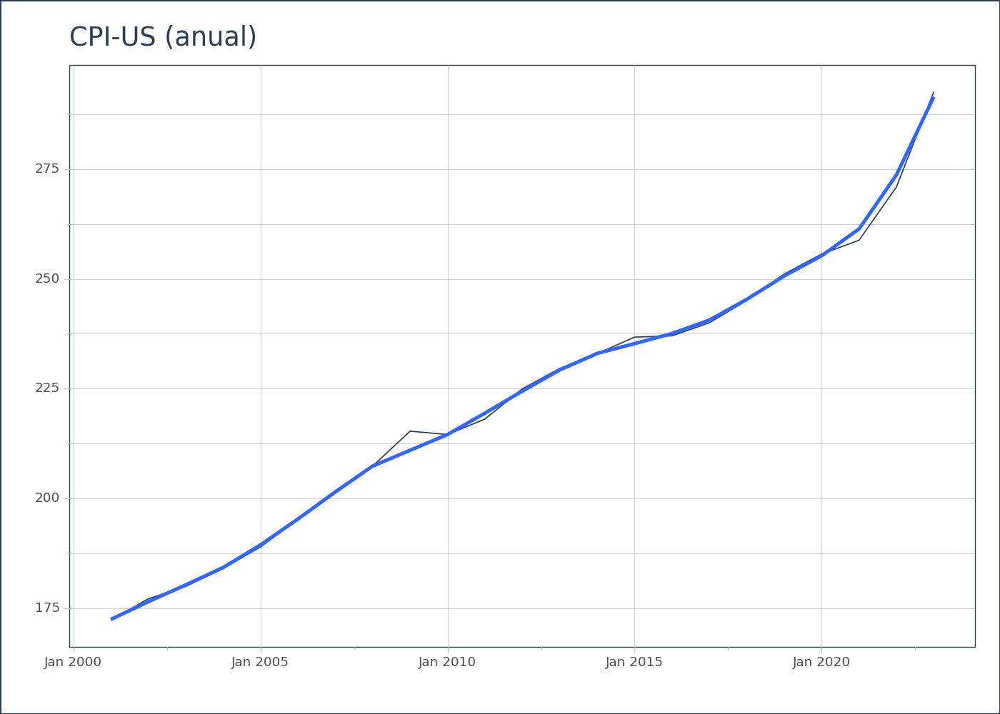

<Figure Size: (700 x 500)>

In [9]:
(cpi_us_y
 .to_pandas()
 .plot_timeseries(date_column = 'Data',
                  value_column = 'cpi',
                  engine = 'plotnine',
                  title = 'CPI-US (anual)'))

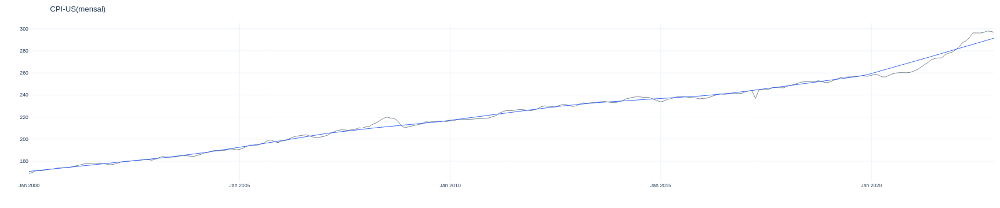

In [10]:
(cpi_us_m.to_pandas()
.plot_timeseries(date_column = 'Data',
                 value_column = 'cpi',
                 engine = 'plotly',
                 title = 'CPI-US(mensal)')
)

In [11]:
data_exp_yc = (data_exp_y
 .join(on='Data', other=cpi_us_y, how='left')
 .with_columns((pl.col('Valor FOB (US$)') * pl.col('correction')).alias('ValExp'))
 .rename({"Data": "Date", "Países": "Countries", "Quilograma Líquido": "VolExp"})       
 .select(pl.col('Date'), pl.col('Countries'), pl.col('ValExp'), pl.col('VolExp'))
 )

data_exp_mc = (data_exp_m
 .join(on='Data', other=cpi_us_m, how='left')
 .with_columns((pl.col('Valor FOB (US$)') * pl.col('correction')).alias('ValExp'))
 .rename({"Data": "Date", "Países": "Countries", "Quilograma Líquido": "VolExp"})       
 .select(pl.col('Date'), pl.col('Countries'), pl.col('ValExp'), pl.col('VolExp'))
 )

In [12]:
display(data_exp_yc.head())
display(data_exp_mc.head())

Date,Countries,ValExp,VolExp
date,str,f64,f64
2022-12-31,"""Paraguai""",7.156293e6,5.07667e6
2022-12-31,"""Uruguai""",997367.0,637117.0
2022-12-31,"""Haiti""",741014.0,553503.0
2022-12-31,"""Estados Unidos…",447893.0,220373.0
2022-12-31,"""China""",404647.0,105395.0


Date,Countries,ValExp,VolExp
date,str,f64,f64
2022-12-01,"""Paraguai""",538950.0,381911.0
2022-12-01,"""Uruguai""",116540.0,17576.0
2022-12-01,"""China""",83231.0,19306.0
2022-12-01,"""Togo""",25519.0,17280.0
2022-12-01,"""Estados Unidos…",23152.0,6505.0


In [13]:
# agrega os dados por valor
exp_by_country = (data_exp_yc.group_by("Countries")
               .agg((pl.col('ValExp').sum().alias('sum_val')),
                    pl.col('VolExp').sum().alias('sum_vol'),
                    (pl.col('ValExp').mean().alias('mean_val')),
                    (pl.col('VolExp').mean().alias('mean_vol')),
                    (pl.col('ValExp').median().alias('median_val')),
                    (pl.col('VolExp').median().alias('median_vol'))
                    )
               ).sort('sum_val', descending=True)

# agrega os dados por ano
exp_by_year = ((data_exp_yc
               .sort('Date', descending=False)
               .group_by_dynamic('Date',every='1y')
               .agg((pl.col('ValExp').sum().alias('sum_val')),
                    (pl.col('ValExp').mean().alias('mean_val')),
                    (pl.col('ValExp').median().alias('median_val')),
               ))
              .join(
              (data_exp_yc.sort('Date', descending=False)
                .group_by_dynamic('Date',every='1y')
                .agg((pl.col('VolExp').sum().alias('sum_vol')),
                     (pl.col('VolExp').mean().alias('mean_vol')),
                     (pl.col('VolExp').median().alias('median_vol'))
                     )
              ), on='Date')
)


# agrega os dados por mês
exp_by_month = ((data_exp_mc
               .sort('Date', descending=False)
               .group_by_dynamic('Date',every='1m')
               .agg((pl.col('ValExp').sum().alias('sum_val')),
                    (pl.col('ValExp').mean().alias('mean_val')),
                    (pl.col('ValExp').median().alias('median_val')),
               ))
              .join(
              (data_exp_mc.sort('Date', descending=False)
                .group_by_dynamic('Date',every='1m')
                .agg((pl.col('VolExp').sum().alias('sum_vol')),
                     (pl.col('VolExp').mean().alias('mean_vol')),
                     (pl.col('VolExp').median().alias('median_vol'))
                     )
              ), on='Date')
)

In [14]:
display(exp_by_country.head())
display(exp_by_year.head())
display(exp_by_month.head())


Countries,sum_val,sum_vol,mean_val,mean_vol,median_val,median_vol
str,f64,f64,f64,f64,f64,f64
"""Paraguai""",5.8453e7,4.9527001e7,2.5414e6,2.1533e6,1.2682e6,1.967985e6
"""Rússia""",2.6365e7,5.9879899e7,2.0280e6,4.6061e6,244408.464276,266400.0
"""Estados Unidos…",1.5608e7,5.001324e6,678629.507438,217448.869565,690638.706817,220373.0
"""Reino Unido""",6.1202e6,1.36871e6,340012.862049,76039.444444,250387.801476,64249.5
"""Japão""",6.0588e6,4.346148e6,263424.695771,188962.956522,188211.282214,106426.0


Date,sum_val,mean_val,median_val,sum_vol,mean_vol,median_vol
date,f64,f64,f64,f64,f64,f64
2000-01-01,5.7995e6,579949.586902,94165.400189,6.246172e6,624617.2,42650.0
2001-01-01,4.2429e6,326376.360822,15928.297826,5.525288e6,425022.153846,10666.0
2002-01-01,1.7617e6,103628.654169,8605.586159,2.250037e6,132355.117647,6800.0
2003-01-01,1.0675e6,82117.622709,18190.734973,1.378345e6,106026.538462,7614.0
2004-01-01,2.4643e6,94779.66517,16842.767774,2.801995e6,107769.038462,4651.5


Date,sum_val,mean_val,median_val,sum_vol,mean_vol,median_vol
date,f64,f64,f64,f64,f64,f64
2000-01-01,410387.540284,102596.885071,33711.767773,456813.0,114203.25,32153.0
2000-02-01,317717.583039,52952.930506,3534.332155,344348.0,57391.333333,859.0
2000-03-01,377305.266355,75461.053271,19995.859813,472329.0,94465.8,6704.0
2000-04-01,393508.632808,78701.726562,39970.106246,442852.0,88570.4,25872.0
2000-05-01,410838.693878,82167.738776,22645.061224,446357.0,89271.4,11664.0


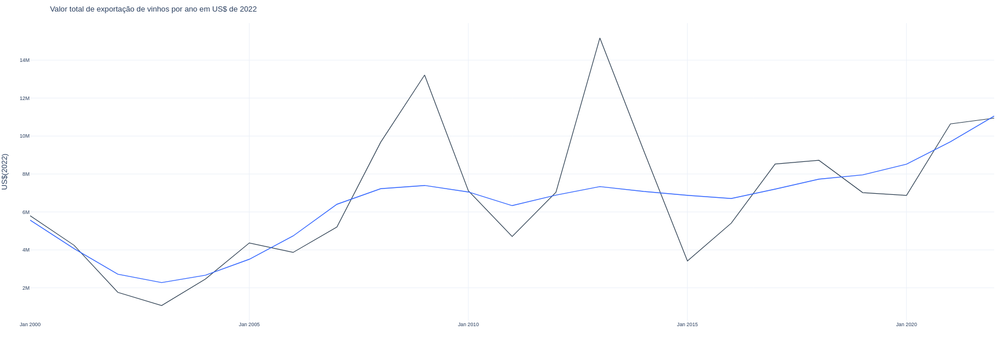

In [15]:
exp_by_year.to_pandas() \
    .plot_timeseries(date_column = 'Date', 
                     value_column='sum_val',
                     title='Valor total de exportação de vinhos por ano em US$ de 2022',
                     y_lab = 'US$(2022)',
                     line_size=1.2,
                     smooth=True, 
                     smooth_color='#3366FF', 
                     smooth_frac=0.3,
                     smooth_size=1.4,                     
                    width = 800,
                    height = 600)           
    

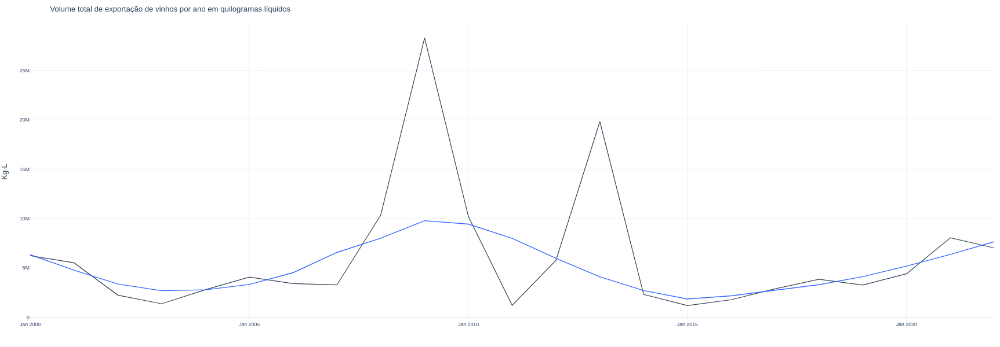

In [16]:
exp_by_year.to_pandas() \
    .plot_timeseries(date_column = 'Date', 
                     value_column='sum_vol',
                     title='Volume total de exportação de vinhos por ano em quilogramas líquidos',
                     y_lab = 'Kg-L',
                     line_size=1.2,
                     smooth=True, 
                     smooth_color='#3366FF', 
                     smooth_frac=0.3,
                     smooth_size=1.4,                     
                    width = 800,
                    height = 600)   

# Exportação total por mês

## Valor total

In [17]:
exp_by_month.to_pandas() \
    .plot_timeseries(date_column = 'Date', 
                     value_column='sum_val',
                     title='Valor total de exportação de vinhos por mês em US$ de 2022',
                     y_lab = 'US$(2022)',
                     line_size=1.2,
                     smooth=True, 
                     smooth_color='#3366FF', 
                     smooth_frac=0.3,
                     smooth_size=1.4,                     
                    width = 800,
                    height = 600)  

## Volume total

In [18]:
exp_by_month.to_pandas() \
    .plot_timeseries(date_column = 'Date', 
                     value_column='sum_vol',
                     title='Volume total de exportação de vinhos por mês em US$ de 2022',
                     y_lab = 'US$(2022)',
                     line_size=1.2,
                     smooth=True, 
                     smooth_color='#3366FF', 
                     smooth_frac=0.1,
                     smooth_size=1.4,                     
                    width = 800,
                    height = 600)  

## Detecção de anomalias e previsão

### Detecção de anomalias no valor total mensal

In [19]:
anomalize_exp_by_month_val = (exp_by_month.to_pandas()    
                    .anomalize(
                                date_column = "Date", 
                                value_column = "sum_val", 
                    ))

anomalize_exp_by_month_val.glimpse()

<class 'pandas.core.frame.DataFrame'>: 276 rows of 12 columns
Date:               datetime64[ms]    [Timestamp('2000-01-01 00:00:00'), ...
observed:           float32           [410387.53125, 317717.59375, 37730 ...
seasonal:           float32           [-39638.609375, -136922.53125, -42 ...
seasadj:            float32           [450026.125, 454640.125, 419601.06 ...
trend:              float32           [540942.9375, 529689.125, 518414.0 ...
remainder:          float32           [-90916.8203125, -75049.03125, -98 ...
anomaly:            object            ['No', 'No', 'No', 'No', 'No', 'No ...
anomaly_score:      float32           [193079.8125, 177212.03125, 200976 ...
anomaly_direction:  int8              [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,  ...
recomposed_l1:      float32           [-27067.9375, -135605.671875, -522 ...
recomposed_l2:      float32           [1234002.625, 1125464.875, 1208816 ...
observed_clean:     float32           [410387.53125, 317717.59375, 37730 ...


In [20]:
anomalize_exp_by_month_val.plot_anomalies_decomp(date_column = "Date", width=1000, height=1000 )

In [21]:
anomalize_exp_by_month_val.plot_anomalies(date_column = "Date", facet_ncol= 1, width=800, height=600 )

In [22]:
anomalize_exp_by_month_val.plot_anomalies_cleaned(date_column = "Date", facet_ncol= 1, width=800, height=600 )

### Previsão de valor total mensal

In [23]:
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
%matplotlib inline

from pmdarima.arima import auto_arima
from pmdarima import arima
from pmdarima.utils import tsdisplay, autocorr_plot, decomposed_plot, plot_acf, plot_pacf
#from pmdarima.arima import ADFTest
#from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import model_selection


In [24]:
anomalize_exp_by_month_val.observed_clean

0       410,387.53
1       317,717.59
2       377,305.28
3       393,508.62
4       410,838.69
          ...     
271   1,227,166.75
272     946,835.00
273     996,181.31
274     673,694.12
275     832,991.00
Name: observed_clean, Length: 276, dtype: float32

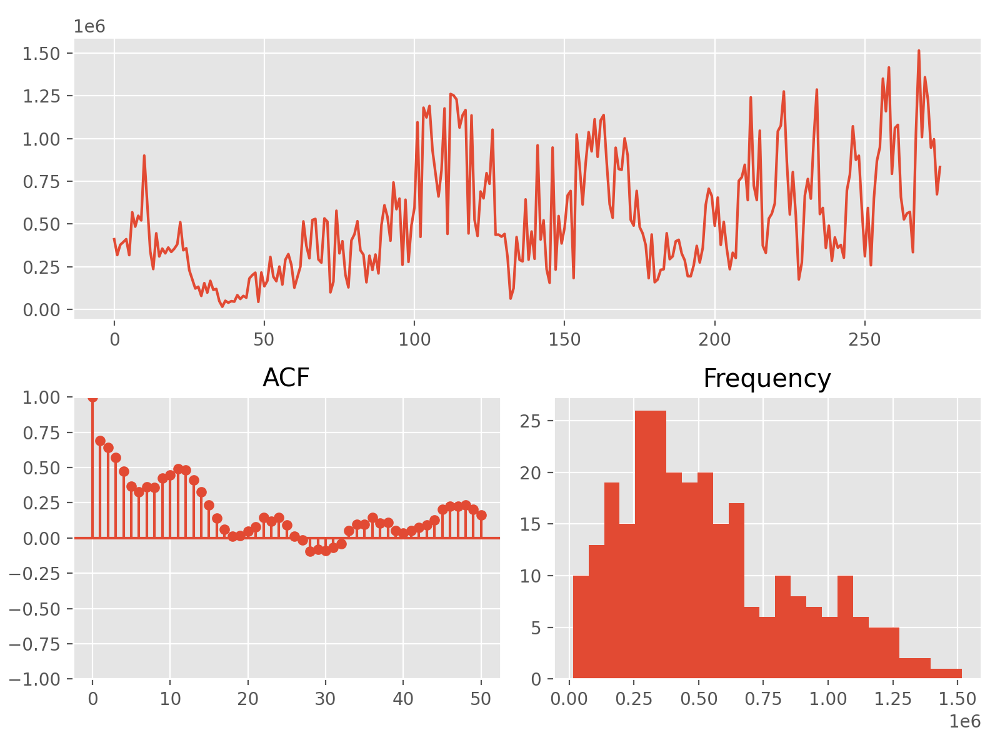

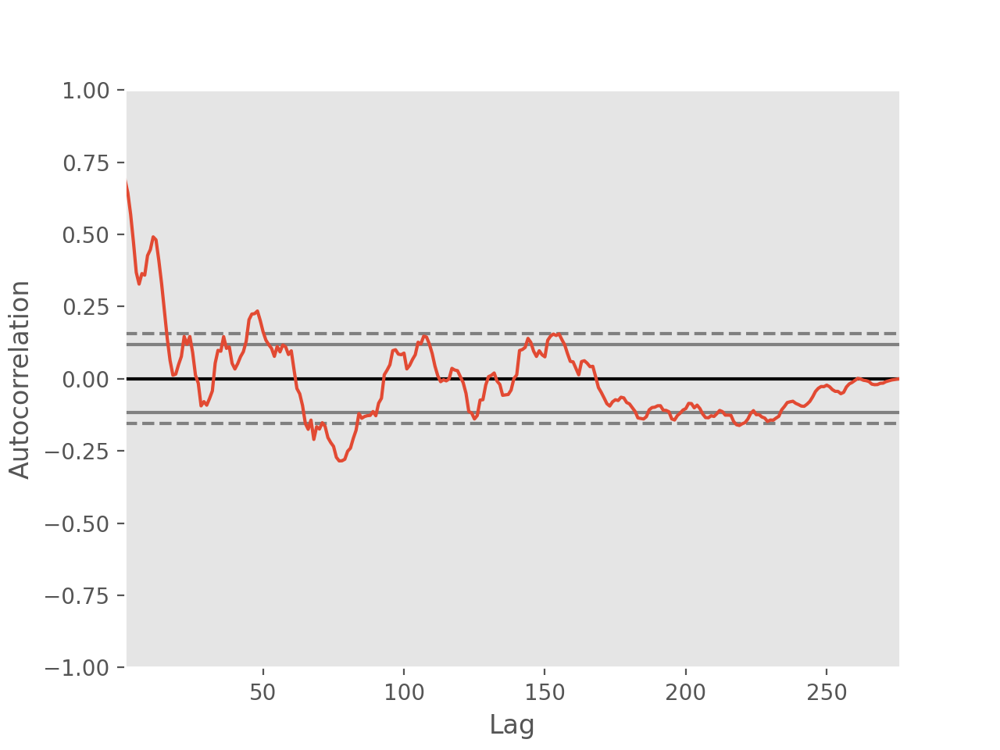

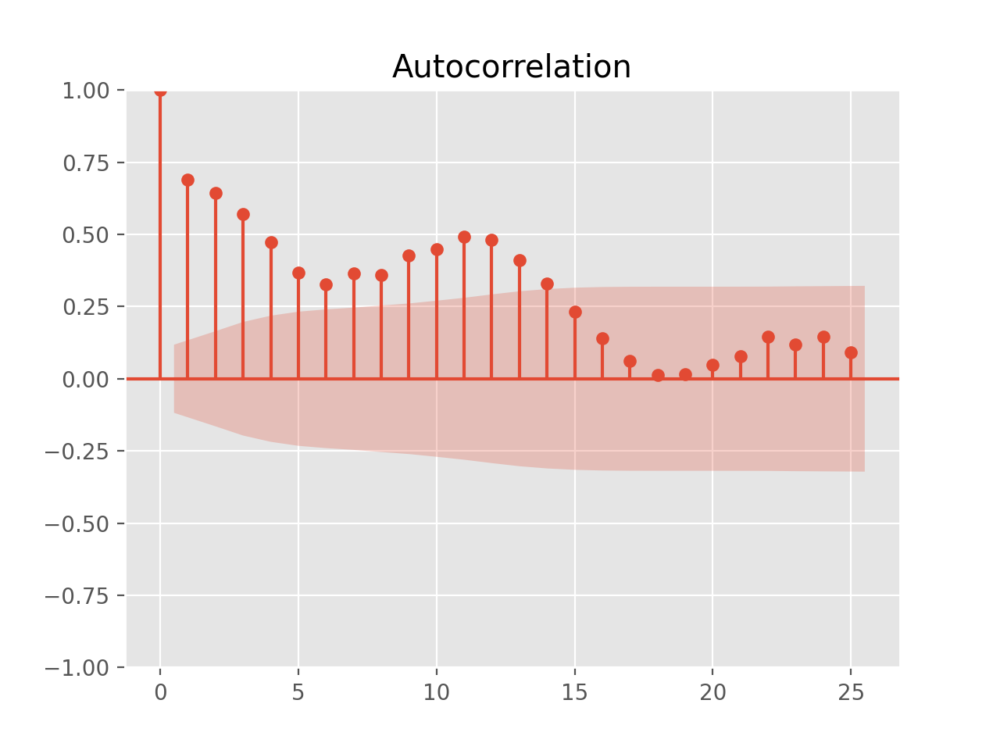

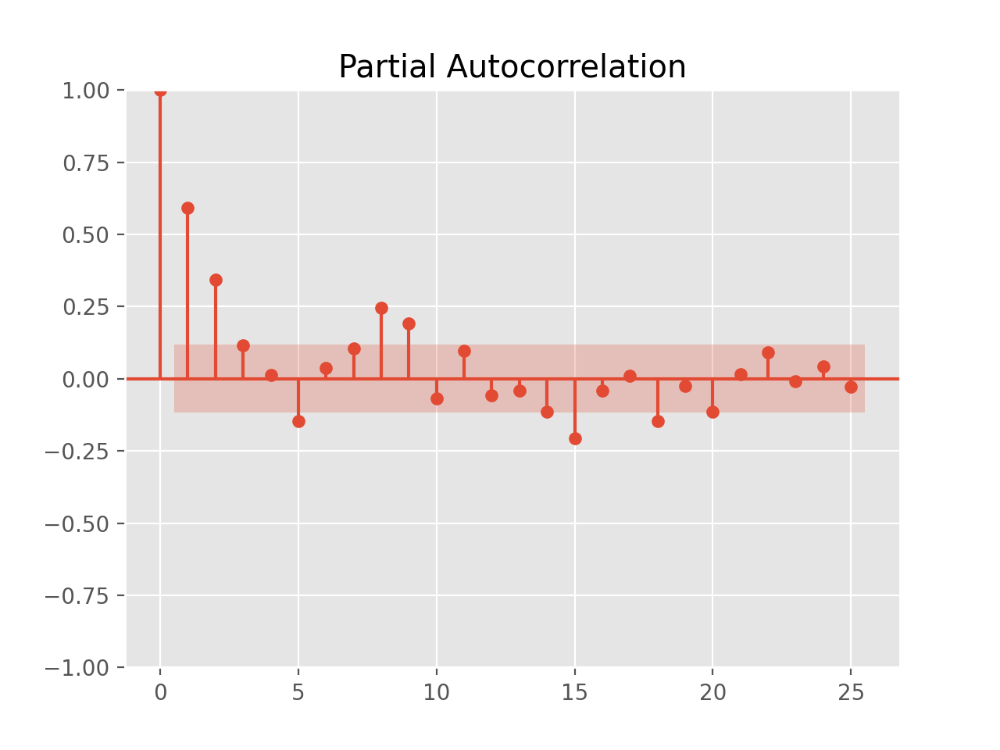

None

None

None

None

In [25]:
data = anomalize_exp_by_month_val.observed_clean
p1: plt.Figure | None = tsdisplay(data)
p2: plt.Figure | None = autocorr_plot(data)
p3: plt.Figure | None = plot_acf(data, alpha=0.05)
p4: plt.Figure | None = plot_pacf(exp_by_month.to_pandas().sum_val, alpha=0.05)

display(p1)
display(p2)
display(p3)
display(p4)

In [26]:
import numpy as np 

TEST_SIZE = 36
train, test = data.iloc[:-TEST_SIZE], data.iloc[-TEST_SIZE:]
x_train, x_test = np.array(range(train.shape[0])), np.array(range(train.shape[0], data.shape[0]))
train.shape, x_train.shape, test.shape, x_test.shape


model = auto_arima(train, start_p=1, start_q=1,
                        test='adf',     
                        d=0,
                        max_p=6,
                        max_q=6,
                        max_d=2,
                        m=12,
                        seasonal=True,
                        trace=True,
                        error_action='ignore',suppress_warnings=True)

Performing stepwise search to minimize aic


 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=6586.091, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=6756.443, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=6616.979, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=6681.125, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=7055.642, Time=0.01 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=6585.890, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=6592.811, Time=0.03 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=6586.815, Time=0.36 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=6588.708, Time=0.20 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=6618.007, Time=0.06 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=6581.215, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=6589.232, Time=0.04 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=6583.171, Time=0.22 sec
 ARIMA(2,0,1)(0,0,2)[12] intercept   : AIC=6581.860, Time=0.51 sec


In [27]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  240
Model:             SARIMAX(1, 0, 3)x(1, 0, [], 12)   Log Likelihood               -3282.412
Date:                             Thu, 11 Jan 2024   AIC                           6578.824
Time:                                     23:02:46   BIC                           6603.189
Sample:                                          0   HQIC                          6588.641
                                             - 240                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   9.348e+04   3.92e+04      2.384      0.017    1.66e+04     1.7e+05
ar.L1          0.7608      0.078      9.784      0.000       0.608       0.913
ma.L1         -0.4734      0.091     -5.199      0.000      -0.652      -0.295
ma.L2          0.1926      0.063      3.045      0.002       0.069       0.317
ma.L3          0.1683      0.075      2.229      0.026       0.020       0.316
ar.S.L12       0.2181      0.069      3.151      0.002       0.082       0.354
sigma2       4.78e+10      0.100    4.8e+11      0.000    4.78e+10    4.78e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                12.74
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               2.64   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.15e+27. Standard errors may be unstable.
"""

In [28]:
prediction, confint = model.predict(n_periods=TEST_SIZE, return_conf_int=True)

prediction

240   251,944.69
241   312,304.43
242   421,018.01
243   469,805.34
244   465,571.35
         ...    
271   498,685.37
272   499,460.00
273   497,335.26
274   498,917.97
275   496,963.82
Length: 36, dtype: float64

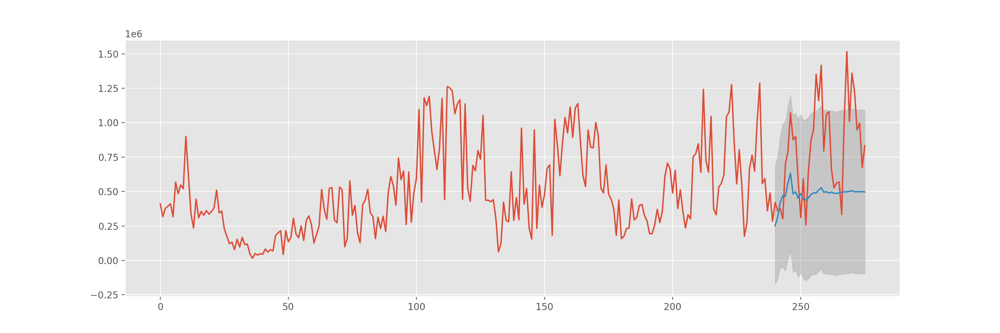

In [29]:
cf= pd.DataFrame(confint)
prediction_series = pd.Series(prediction,index=test.index)
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
ax.plot(data.values)
ax.plot(prediction_series)
ax.fill_between(prediction_series.index,
                cf[0],
                cf[1],color='grey',alpha=.3)

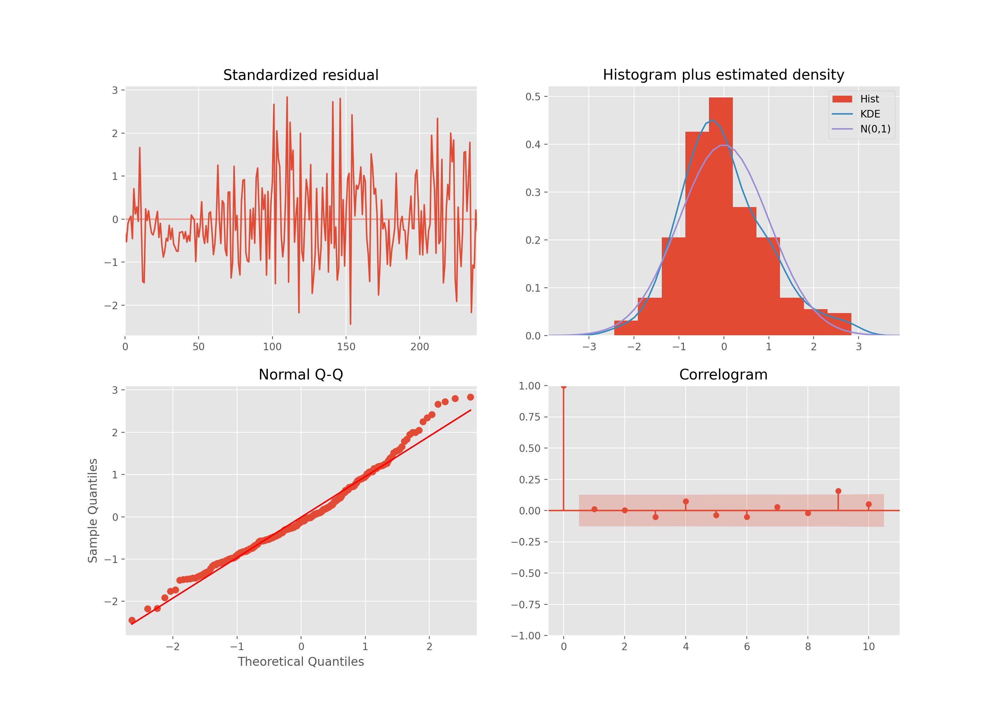

In [30]:
model.plot_diagnostics(figsize=(14,10))
plt.show()

In [31]:
def calcsmape(actual, forecast):
    return 1/len(actual) * np.sum(2 * np.abs(forecast-actual) / (np.abs(actual) + np.abs(forecast)))

smape=calcsmape(test.values ,prediction)
smape

0.5142098218261559

### Modelo Prophet

In [32]:
anomalize_exp_by_month_val.head()

,Date,observed,...,recomposed_l2,observed_clean
0,2000-01-01,"410,387.53",...,"1,234,002.62","410,387.53"
1,2000-02-01,"317,717.59",...,"1,125,464.88","317,717.59"
2,2000-03-01,"377,305.28",...,"1,208,816.62","377,305.28"
3,2000-04-01,"393,508.62",...,"1,162,639.25","393,508.62"
4,2000-05-01,"410,838.69",...,"1,178,220.62","410,838.69"


In [33]:
prophet_data = pd.DataFrame()
prophet_data['ds'] = anomalize_exp_by_month_val.Date
prophet_data['y'] = anomalize_exp_by_month_val.observed_clean
prophet_data.tail()

,ds,y
271,2022-08-01,"1,227,166.75"
272,2022-09-01,"946,835.00"
273,2022-10-01,"996,181.31"
274,2022-11-01,"673,694.12"
275,2022-12-01,"832,991.00"


In [34]:
from prophet import Prophet
# Python
m = Prophet(seasonality_mode='multiplicative', 
            mcmc_samples=500, 
            weekly_seasonality=False, 
            daily_seasonality=False, 
            yearly_seasonality=True,
            changepoint_range=0.95)
m.fit(prophet_data, show_progress=True)

DEBUG:cmdstanpy:cmd: /home/juno/.cache/pypoetry/virtualenvs/winedata-CzOYOszx-py3.11/lib/python3.11/site-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpy54d4flz/mp30d_53.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpy54d4flz/ytgutyja.json
23:02:47 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/home/juno/.cache/pypoetry/virtualenvs/winedata-CzOYOszx-py3.11/lib/python3.11/site-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=41354', 'data', 'file=/tmp/tmpy54d4flz/mp30d_53.json', 'init=/tmp/tmpy54d4flz/ytgutyja.json', 'output', 'file=/tmp/tmpy54d4flz/prophet_model9l7ald6c/prophet_model-20240111230247_1.csv', 'method=sample', 'num_samples=250', 'num_warmup=250', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 3
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/home/juno/.cache/pypoetry/virtualenvs/winedata-CzOYOszx-py3.11/lib/python3.11/site-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=41354', 'data', 'file=/tmp/tmpy54d4flz/mp30d_53.json', 'init=/tmp/tmpy54d4flz/ytgutyja.json', 'output', 'file=/tm

23:02:57 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/home/juno/.cache/pypoetry/virtualenvs/winedata-CzOYOszx-py3.11/lib/python3.11/site-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=41354', 'data', 'file=/tmp/tmpy54d4flz/mp30d_53.json', 'init=/tmp/tmpy54d4flz/ytgutyja.json', 'output', 'file=/tmp/tmpy54d4flz/prophet_model9l7ald6c/prophet_model-20240111230247_1.csv', 'method=sample', 'num_samples=250', 'num_warmup=250', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpy54d4flz/prophet_model9l7ald6c/prophet_model-20240111230247_1.csv
 console_msgs (if any):
	/tmp/tmpy54d4flz/prophet_model9l7ald6c/prophet_model-20240111230247_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 250
    num_warmup = 

In [35]:
# Python
future = m.make_future_dataframe(periods=24, freq='MS')
future.tail()

,ds
295,2024-08-01
296,2024-09-01
297,2024-10-01
298,2024-11-01
299,2024-12-01


In [36]:
# Python
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
295,2024-08-01,"173,426.32","-469,065.33","924,567.37"
296,2024-09-01,"-295,173.55","-1,198,780.38","545,323.48"
297,2024-10-01,"-69,813.76","-805,167.24","678,491.52"
298,2024-11-01,"-331,290.64","-1,259,825.09","595,502.80"
299,2024-12-01,"48,519.69","-723,823.46","752,221.67"


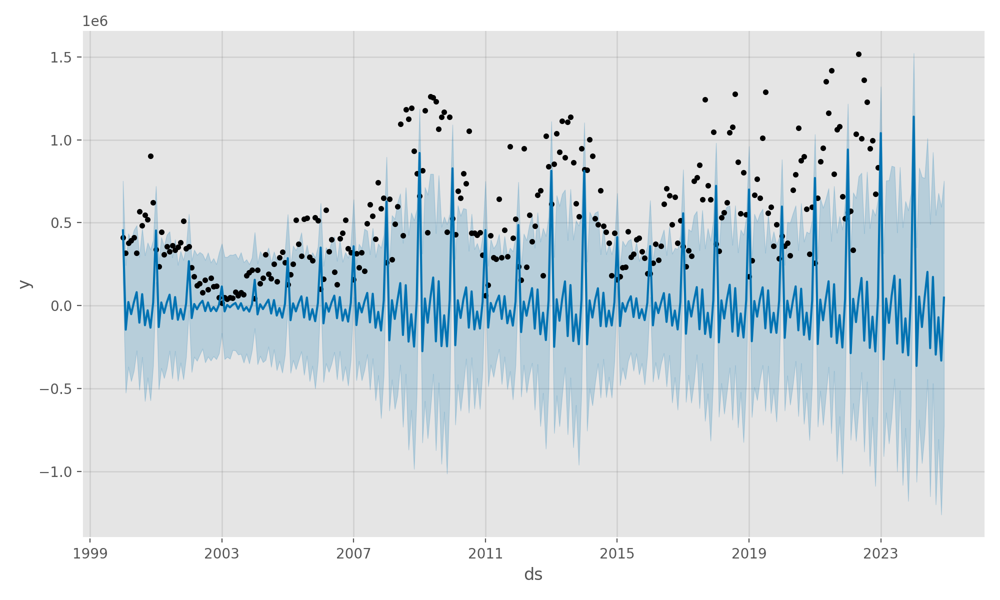

In [37]:
# Python
fig1 = m.plot(forecast)

In [39]:
#anomalize_exp_by_month_val.head()
#df.head()

### Detecção de anomalias no volume total mensal

In [40]:
anomalize_exp_by_month_vol = (exp_by_month.to_pandas()    
                    .anomalize(
                                date_column = "Date", 
                                value_column = "sum_vol", 
                    ))

anomalize_exp_by_month_vol.glimpse()

<class 'pandas.core.frame.DataFrame'>: 276 rows of 12 columns
Date:               datetime64[ms]    [Timestamp('2000-01-01 00:00:00'), ...
observed:           float32           [456813.0, 344348.0, 472329.0, 442 ...
seasonal:           float32           [-76285.3046875, -173116.171875, - ...
seasadj:            float32           [533098.3125, 517464.15625, 503938 ...
trend:              float32           [601269.0, 589897.875, 578487.6875 ...
remainder:          float32           [-68170.6875, -72433.734375, -7454 ...
anomaly:            object            ['No', 'No', 'No', 'No', 'No', 'No ...
anomaly_score:      float32           [151276.515625, 155539.5625, 15765 ...
anomaly_direction:  int8              [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,  ...
recomposed_l1:      float32           [83822.296875, -24379.6484375, 105 ...
recomposed_l2:      float32           [1132356.75, 1024154.75, 1154251.6 ...
observed_clean:     float32           [456813.0, 344348.0, 472329.0, 442 ...


In [41]:
anomalize_exp_by_month_vol.plot_anomalies_decomp(date_column = "Date", width=1000, height=1000 )

In [42]:
anomalize_exp_by_month_vol.plot_anomalies(date_column = "Date", facet_ncol= 1, width=800, height=600 )

In [43]:
anomalize_exp_by_month_vol.plot_anomalies_cleaned(date_column = "Date", facet_ncol= 1, width=800, height=600 )

In [44]:
(data_exp_yc.filter(pl.col('Countries')
                    .is_in(exp_by_country
                           .top_k(8, by='sum_val')
                           .select(pl.col('Countries'))
                           .to_series()
                           .to_list()))
                    .to_pandas()
                    .groupby('Countries')
                    .plot_timeseries(date_column = 'Date', 
                        value_column='ValExp',
                        title='Valor total de exportação de vinhos por ano em US$ de 2022',
                        y_lab = 'US$(2022)',
                        line_size=1.2,
                        smooth=True, 
                        smooth_color='#3366FF', 
                        smooth_frac=0.3,
                        smooth_size=1.4,                     
                        width = 1080,
                        height = 720,
                        facet_ncol=2,
                        facet_scales="free")
    )

In [45]:
exp_mc_top8 = (data_exp_mc.filter(pl.col('Countries')
                    .is_in(exp_by_country
                           .top_k(8, by='sum_val')
                           .select(pl.col('Countries'))
                           .to_series()
                           .to_list()))
                    )

(exp_mc_top8.to_pandas().groupby('Countries')
                    .plot_timeseries(date_column = 'Date', 
                        value_column='ValExp',
                        title='Valor total de exportação de vinhos por mês em US$ de 2022',
                        y_lab = 'US$(2022)',
                        line_size=1.2,
                        smooth=True, 
                        smooth_color='#3366FF', 
                        smooth_frac=0.08,
                        smooth_size=1.4,                     
                        width = 1080,
                        height = 720,
                        facet_ncol=2,
                        facet_scales="free",
                        engine="plotly")
)

In [46]:
exp_mc_top8.head()

Date,Countries,ValExp,VolExp
date,str,f64,f64
2022-12-01,"""Paraguai""",538950.0,381911.0
2022-12-01,"""China""",83231.0,19306.0
2022-12-01,"""Estados Unidos…",23152.0,6505.0
2022-12-01,"""Reino Unido""",16459.0,1833.0
2022-12-01,"""Japão""",236.0,69.0


In [47]:
anomalize_exp_mc_Russia = (exp_mc_top8.filter(pl.col('Countries').is_in(['Estados Unidos'])).to_pandas()
                                .anomalize(
                                            date_column = "Date", 
                                            value_column = "ValExp", 
                                            #iqr_alpha = 0.15, 
                                            #clean_alpha = 0.75,
                                            #clean = "min_max",
                                            verbose = True,
                                ))

#anomalize_exp_mc_Russia.glimpse()
anomalize_exp_mc_Russia.plot_anomalies(date_column = "Date", facet_ncol= 1, width=800, height=600 )

Using seasonal frequency of 217 observations
Using trend frequency of 217 observations


ValueError: trend must be an odd positive integer >= 3 where trend > period

In [48]:
anomalize_exp_mc_Russia.plot_anomalies_decomp(date_column = "Date", width=1000, height=1000 )

NameError: name 'anomalize_exp_mc_Russia' is not defined

In [ ]:
anomalize_exp_mc_Russia.plot_anomalies(date_column = "Date", facet_ncol= 1, width=800, height=600 )

## Dados de avaliação de vinhos (https://github.com/rogerioxavier/X-Wines/)

In [54]:
wine_ratings =pd.read_csv('../data/XWines_Slim_1K_wines_150K_ratings/XWines_Slim_150K_ratings.csv')
wine_ratings.glimpse()

<class 'pandas.core.frame.DataFrame'>: 150000 rows of 6 columns
RatingID:  int64             [143, 199, 348, 374, 834, 876, 1005, 1020,  ...
UserID:    int64             [1356810, 1173759, 1164877, 1207665, 107584 ...
WineID:    int64             [103471, 111415, 111395, 111433, 111431, 11 ...
Vintage:   object            [1950, 1951, 1952, 1953, 1955, 1955, 1955,  ...
Rating:    float64           [4.5, 5.0, 5.0, 5.0, 5.0, 5.0, 4.5, 5.0, 5. ...
Date:      object            ['2021-11-02 20:52:59', '2015-08-20 17:46:2 ...


In [55]:
wines = pd.read_csv('../data/XWines_Slim_1K_wines_150K_ratings/XWines_Slim_1K_wines.csv')
wines.glimpse()

<class 'pandas.core.frame.DataFrame'>: 1007 rows of 17 columns
WineID:      int64             [100001, 100002, 100003, 100005, 100007,  ...
WineName:    object            ['Espumante Moscatel', 'Ancellotta', 'Cab ...
Type:        object            ['Sparkling', 'Red', 'Red', 'Red', 'Spark ...
Elaborate:   object            ['Varietal/100%', 'Varietal/100%', 'Varie ...
Grapes:      object            ["['Muscat/Moscato']", "['Ancellotta']",  ...
Harmonize:   object            ["['Pork', 'Rich Fish', 'Shellfish']", "[ ...
ABV:         float64           [7.5, 12.0, 12.0, 11.0, 7.5, 13.5, 14.0,  ...
Body:        object            ['Medium-bodied', 'Medium-bodied', 'Full- ...
Acidity:     object            ['High', 'Medium', 'High', 'Medium', 'Hig ...
Code:        object            ['BR', 'BR', 'BR', 'BR', 'BR', 'BR', 'PT' ...
Country:     object            ['Brazil', 'Brazil', 'Brazil', 'Brazil',  ...
RegionID:    int64             [1001, 1001, 1001, 1001, 1001, 1001, 1038 ...
RegionName:  

In [61]:
wines_and_ratings = pd.merge(wine_ratings, wines, on='WineID', how='inner')
wines_and_ratings.glimpse()

<class 'pandas.core.frame.DataFrame'>: 150000 rows of 22 columns
RatingID:    int64             [143, 12573, 114932, 130625, 143450, 1438 ...
UserID:      int64             [1356810, 1212696, 1653207, 1314309, 1201 ...
WineID:      int64             [103471, 103471, 103471, 103471, 103471,  ...
Vintage:     object            [1950, 1967, 1989, 1990, 1990, 1990, 1992 ...
Rating:      float64           [4.5, 4.5, 4.0, 4.0, 4.0, 3.5, 4.0, 4.0,  ...
Date:        object            ['2021-11-02 20:52:59', '2018-12-03 19:27 ...
WineName:    object            ['Presidential Colheita Port', 'President ...
Type:        object            ['Dessert/Port', 'Dessert/Port', 'Dessert ...
Elaborate:   object            ['Assemblage/Blend', 'Assemblage/Blend',  ...
Grapes:      object            ["['Touriga Nacional', 'Tinta Roriz']", " ...
Harmonize:   object            ["['Beef', 'Maturated Cheese', 'Hard Chee ...
ABV:         float64           [20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0 ...
Body:      

0         2021-11-02 20:52:59
1         2015-08-20 17:46:26
2         2020-11-13 05:40:26
3         2017-05-05 06:44:13
4         2016-09-14 20:18:38
                 ...         
149995    2021-12-22 21:03:51
149996    2017-04-23 21:07:55
149997    2019-04-14 17:45:08
149998    2021-07-10 07:00:15
149999    2019-09-08 15:42:28
Name: Date, Length: 150000, dtype: object

In [78]:
# filtrar dados de rating médio por país:
country_and_ratings = (pl.from_dataframe(wines_and_ratings[['Country','Code','Date', 'Rating']])
                                    .with_columns(pl.col('Date')
                                    .str.to_datetime())
                       )

avg_ratings_by_country = (country_and_ratings
                          .group_by('Country')
                          .agg(pl.col('Rating')
                               .mean()
                               .alias('avg_rating'))
                          .sort('avg_rating', descending=True)
                          )

In [95]:
px.bar(avg_ratings_by_country.to_pandas()['avg_rating'], 
       x=avg_ratings_by_country.to_pandas()['Country'], 
       y=avg_ratings_by_country.to_pandas()['avg_rating'],
       title='Avaliação média de vinhos por país',
       color=avg_ratings_by_country.to_pandas()['avg_rating'],
        labels={"y":"Avaliação Média", "x":"País"}, width=800, height=500)

In [98]:
avg_ratings_by_country.top_k(10, by='avg_rating')

Country,avg_rating
str,f64
"""United Kingdom…",4.178571
"""Lebanon""",4.162651
"""United States""",3.975056
"""France""",3.973904
"""Hungary""",3.970472
"""Australia""",3.887829
"""South Africa""",3.827631
"""Spain""",3.823961
"""Italy""",3.81819


In [120]:
avg_ratings_by_country.select('Country')[19]

Country
str
"""Brazil"""


## Análise dos dados extraídos da página do [vitibrasil](http://vitibrasil.cnpuv.embrapa.br/index.php?opcao=opt_06)

Leitura dos dados a partir do arquivo com os dados de exportação

In [ ]:
# carrega os dados de importação de vinhos (dados da página indicada)
expvinho_viti = pd.read_csv("../data/ExpVinho.csv", sep=";").drop("Id", axis=1)
expvinho_viti.describe()

,1970,1970.1,...,2022,2022.1
count,128.00,128.00,...,128.00,128.00
mean,"1,062.57",316.41,...,"54,890.49","85,510.02"
std,"8,164.73","2,242.56",...,"453,955.89","641,474.62"
min,0.00,0.00,...,0.00,0.00
25%,0.00,0.00,...,0.00,0.00
50%,0.00,0.00,...,35.00,211.00
75%,0.00,0.00,...,"1,954.50","7,688.25"
max,"89,846.00","23,980.00",...,"5,076,670.00","7,156,293.00"


In [ ]:
expvinho_viti["País"]

0                          Afeganistão
1                        África do Sul
2      Alemanha, República Democrática
3                               Angola
4                             Anguilla
                    ...               
123                             Tuvalu
124                            Uruguai
125                            Vanuatu
126                          Venezuela
127                             Vietnã
Name: País, Length: 128, dtype: object

### Dados a partir do ano 2000


In [ ]:
expvinho_viti_2000 = expvinho_viti[[c for c in expvinho_viti.columns[1:] if int(str(c).split(".")[0]) > 1999]]
expvinho_viti_2000["País"] = expvinho_viti["País"]
expvinho_viti_2000.tail()

,2000,2000.1,...,2022.1,País
123,0,0,...,0,Tuvalu
124,44476,30075,...,997367,Uruguai
125,0,0,...,0,Vanuatu
126,0,0,...,32351,Venezuela
127,0,0,...,277,Vietnã


In [ ]:
expvinho_viti = expvinho_viti_2000

In [ ]:
# constrói dois dataframes, um com dados de valor exportado em US$ e outro com dados de quantidade

# valor
expvinho_viti_val = pd.concat([expvinho_viti.filter(like = 'País', axis=1), expvinho_viti.filter(like = '.1', axis=1)], axis=1)

# quantidade
expvinho_viti_qt = pd.concat([expvinho_viti.filter(like = 'País', axis=1),expvinho_viti.drop(expvinho_viti_val.columns, axis=1)], axis = 1)
expvinho_viti_qt.index = expvinho_viti_qt['País']
expvinho_viti_qt = expvinho_viti_qt.drop('País', axis=1)
expvinho_viti_qt = expvinho_viti_qt.astype('float64')
# renomeia colunas de data para retirar o '.1'
expvinho_viti_val.columns = [name[0:4] for name in expvinho_viti_val.columns]
expvinho_viti_val.index = expvinho_viti_val['País']
expvinho_viti_val = expvinho_viti_val.drop('País', axis=1)
expvinho_viti_val = expvinho_viti_val.astype('float64')
# seleciona colunas acima do ano 1999
#expvinho_viti_qt = expvinho_viti_qt[[x for x in expvinho_viti_qt.columns if int(x) > 1999]]
#expvinho_viti_val = expvinho_viti_val[[x for x in expvinho_viti_val.columns if int(x) > 1999]]



In [ ]:
print_markdown(r"## " + expvinho_val_title + " para cada país a partir de 2000:")
show(expvinho_viti_val)
print("\n\n")
print_markdown(r"## " + expvinho_qt_title + " para cada país a partir de 2000:")
show(expvinho_viti_qt)

## Valor Exportado de Vinho em US$ (FOB) para cada país a partir de 2000:

## Quantidade Exportada de Vinho em Kg (1Kg=1L) para cada país a partir de 2000:

O primeiro ponto a se destacar é que existe na base de dados uma linha correspondente ao Brasil (anos de 2020 a 2023) como pode ser visto a seguir:


In [ ]:
print(f"Brasil - quantidade: {expvinho_viti_qt.loc['Brasil'].sum()},valor: {expvinho_viti_val.loc['Brasil'].sum()}")

Brasil - quantidade: 2535.0,valor: 998.0


É obvio que tais valores não fazem qualquer sentido uma vez que está se considerando somente o vinho exportado. Na base original também existe tal linha, portanto o erro não é específico da página vitibrasil.

Seguindo as boas práticas, tal linha deve ser eliminada dos dataframes com o valor e a quantidade exportada.

In [ ]:
expvinho_viti_qt = expvinho_viti_qt.drop('Brasil', axis=0)
expvinho_viti_val = expvinho_viti_val.drop('Brasil', axis=0)

## Correção dos valores de exportação conforme o índice de inflação dos Estados Unidos (CPI)

Os dados monetários desta série são anuais e estão em US$. Como a ideia é realizar a análise dos dados ao longo do tempo, é importante considerar os efeitos da inflação pois, US$ 1,00 em 2000 é diferente de US$ 1,00 em 2022. Ou seja, caso não se faça a correção pela inflação, haverá imprecisão nos valores apresentados. Ademais, ao se relacionar os valores de exportação com dados socioeconômicos, é importante que os dados estejam na mesma data de referência. Ainda que façamos tal ajuste, ainda resta dúvida quanto à data-base precisa, pois tal informação não foi encontrada em qualquer das fontes de dados. Neste sentido, assumimos que os valores da série são nominais, isto é, os valores são relativos ao ano corrente. Então todos eles foram reajustados para o ano de 2022.

Para realizarmos o ajuste foi extraída a série de [CPI](https://www.bls.gov/cpi/) (_Consumer Price Index_) anual, que é o índice de inflação dos Estados Unidos. O gráfico abaixo demonstra que entre 2000 e 2022 houve um crescimento acumulado do índice na ordem de aproximadamente 52%.

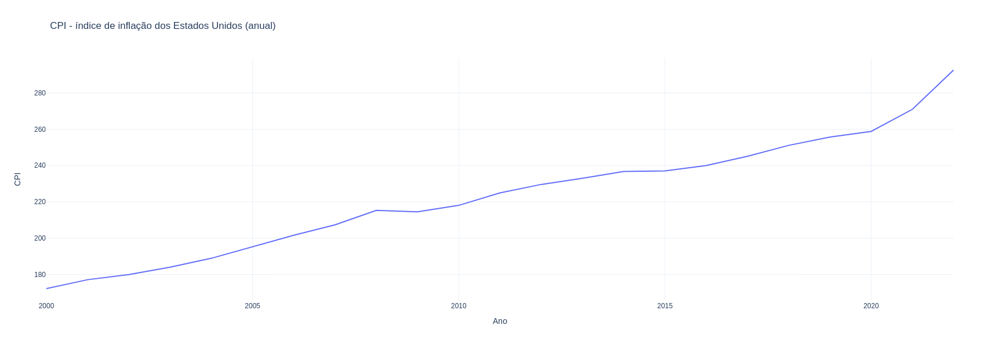

In [ ]:
cpi_us = pd.read_csv(
    "../data/cpi_brazil_us/cpi_series.csv",
    sep=";",
    dtype={"year": 'Int64', "cpi": 'Float64'}
)

cpi_us.set_index('year', inplace=True)

px.line(
    cpi_us,
    y="cpi",
    title="CPI - índice de inflação dos Estados Unidos (anual)",
    width=fig_w,
    height=fig_h,
    labels={"year": "Ano", "cpi":"CPI"},
)

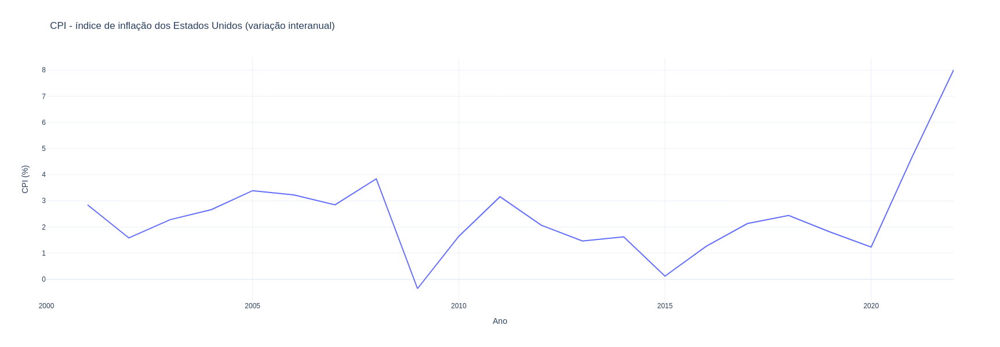

In [ ]:
px.line(
    cpi_us.pct_change(periods=1)*100,
    y="cpi",
    title="CPI - índice de inflação dos Estados Unidos (variação interanual)",
    width=fig_w,
    height=fig_h,
    labels={"year": "Ano", "cpi":"CPI (%)"},
)


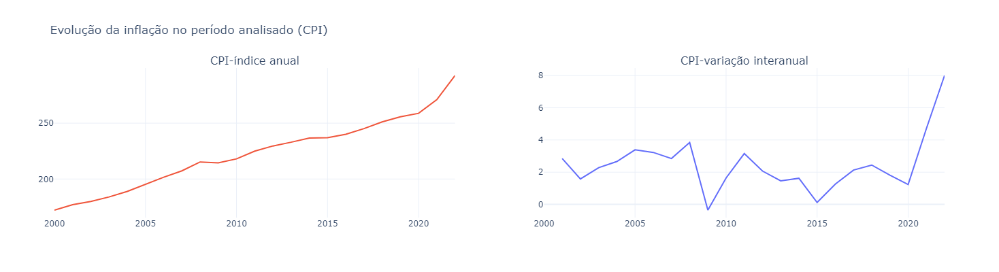

In [ ]:
fig = make_subplots(rows=1,
                    cols=2,
                    subplot_titles=("CPI-índice anual","CPI-variação interanual"))

fig.add_trace(
    go.Scatter(x=cpi_us.index, y = (cpi_us.pct_change(periods=1)*100)['cpi']  ),
    row=1, col=2
)


fig.add_trace(
    go.Scatter(x=cpi_us.index, y= cpi_us['cpi'] ),
    row=1, col=1
)


fig.update_layout(height=fig_h-200, width=fig_w, title_text="Evolução da inflação no período analisado (CPI)", showlegend=False)
fig.show()

# Nova seção

### Aplicando a correção pelo CPI - valores no ano-base de 2022

In [ ]:
correct_idx = 1.0/(cpi_us/cpi_us.loc[2022])
expvinho_viti_val_corrected = {}
for year in expvinho_viti_val.columns:
    expvinho_viti_val_corrected.update({year:[val for val in expvinho_viti_val[year] * correct_idx.loc[int(year)][0]]})

expvinho_viti_val_corrected = pd.DataFrame(expvinho_viti_val_corrected)
expvinho_viti_val_corrected.set_index(expvinho_viti_val.index,inplace=True)

print_markdown(r"## " + expvinho_val_title + " *corrigido pelo CPI* para cada país a partir de 2000:")

show(expvinho_viti_val_corrected)

## Valor Exportado de Vinho em US$ (FOB) *corrigido pelo CPI* para cada país a partir de 2000:

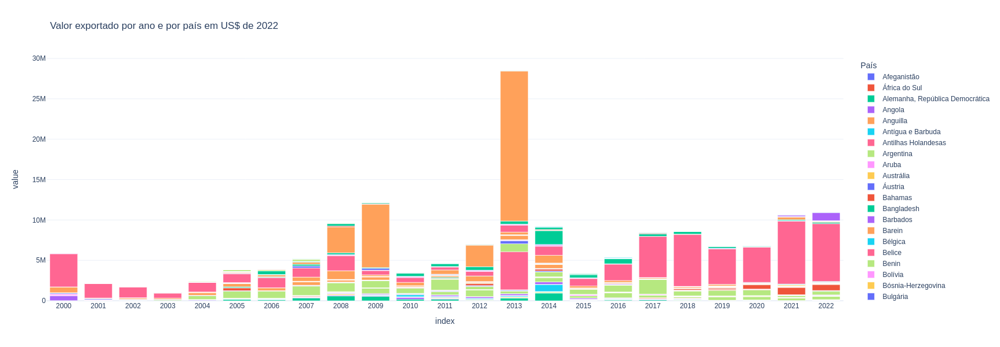

In [ ]:
px.bar(expvinho_viti_val_corrected.transpose(),
       title="Valor exportado por ano e por país em US$ de 2022",
       height=fig_h,
       width=fig_w+300,

      )
#fig.show()

In [ ]:
expvinho_viti_val_corrected_T = expvinho_viti_val_corrected.transpose().reset_index(0)
#expvinho_viti_val_corrected_T.set_index("Ano", inplace=True)
#expvinho_viti_val_corrected_T.droplevel("País", axis=0)
expvinho_viti_val_corrected_T.columns

Index(['Ano', 'Afeganistão', 'África do Sul', 'Alemanha, República Democrática', 'Angola', 'Anguilla', 'Antígua e Barbuda', 'Antilhas Holandesas', 'Argentina', 'Aruba',
       ...
       'Tcheca, República', 'Togo', 'Trinidade Tobago', 'Tunísia', 'Turquia', 'Tuvalu', 'Uruguai', 'Vanuatu', 'Venezuela', 'Vietnã'], dtype='object', name='País', length=128)

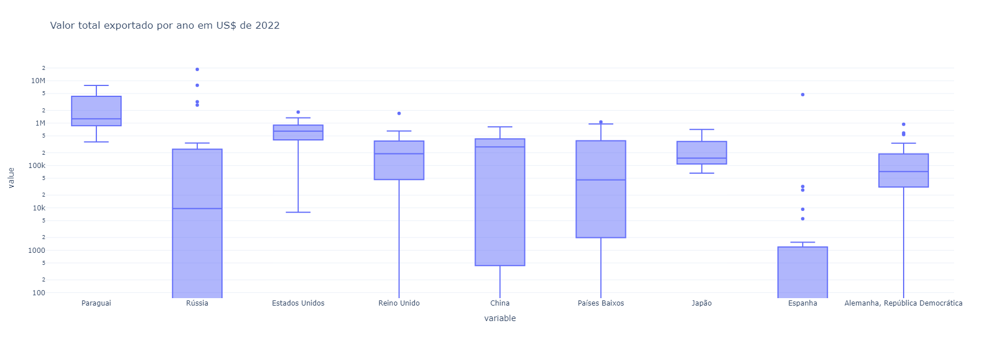

In [ ]:
px.box(expvinho_viti_val_corrected.T,  y = ["Paraguai", "Rússia", "Estados Unidos","Reino Unido", "China",
                                            "Países Baixos", "Japão", "Espanha", "Alemanha, República Democrática" ],
      title="Valor total exportado por ano em US$ de 2022",
       height=fig_h,
       width=fig_w,
       log_y=True,

      )

In [ ]:
expvinho_viti_sum_year = pd.DataFrame({"US$":expvinho_viti_val.sum(),
                                       "US$(2022)":expvinho_viti_val_corrected.sum(),
                                       "L":expvinho_viti_qt.sum(),
                                       "US$/L":expvinho_viti_val.sum()/expvinho_viti_qt.sum(),
                                       "US$(2022)/L":expvinho_viti_val_corrected.sum()/expvinho_viti_qt.sum()})
print_markdown(r"## " + "Valor, Quantidade e Razão entre Valor e Quantidade" + " - total por ano")
show(expvinho_viti_sum_year, caption="Valor, Quantidade e Valor/Quantidade- Total por ano")

## Valor, Quantidade e Razão entre Valor e Quantidade - total por ano

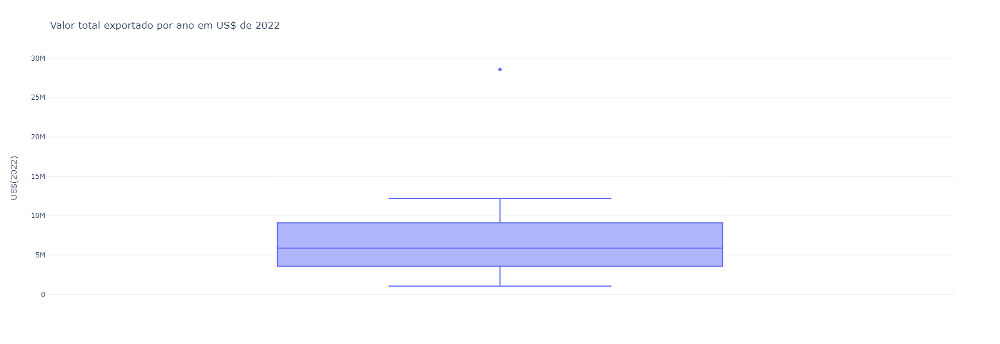

In [ ]:
px.box(expvinho_viti_sum_year,y="US$(2022)",
      title="Valor total exportado por ano em US$ de 2022",
       height=fig_h,
       width=fig_w,
      )

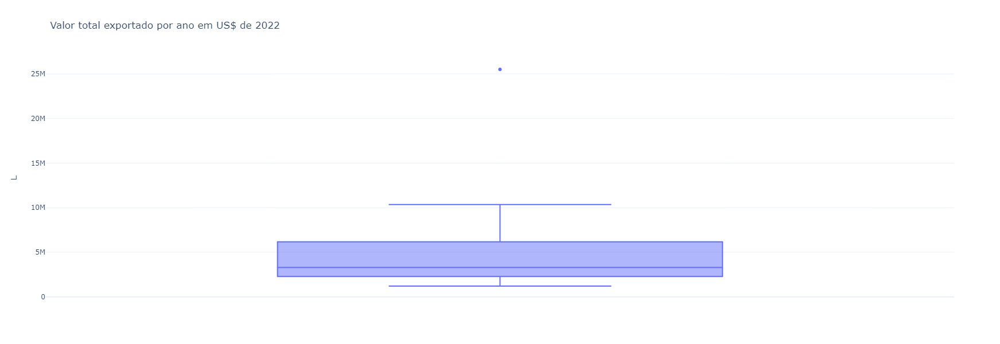

In [ ]:
px.box(expvinho_viti_sum_year,y="L",
      title="Valor total exportado por ano em US$ de 2022",
       height=fig_h,
       width=fig_w,
      )

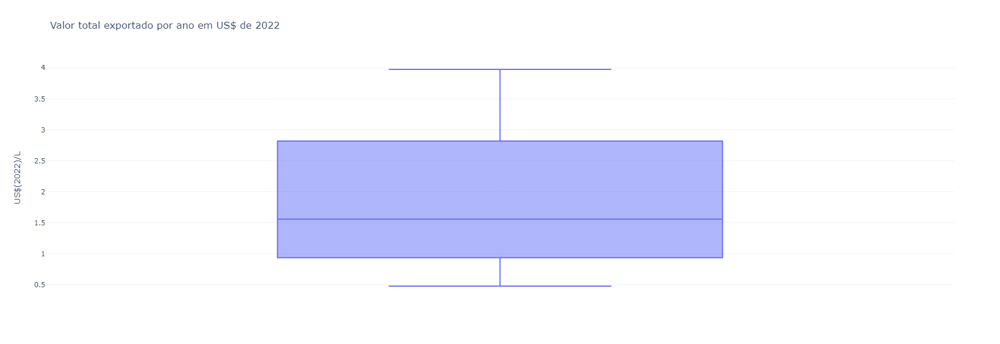

In [ ]:
px.box(expvinho_viti_sum_year,y="US$(2022)/L",
      title="Valor total exportado por ano em US$ de 2022",
       height=fig_h,
       width=fig_w,
      )

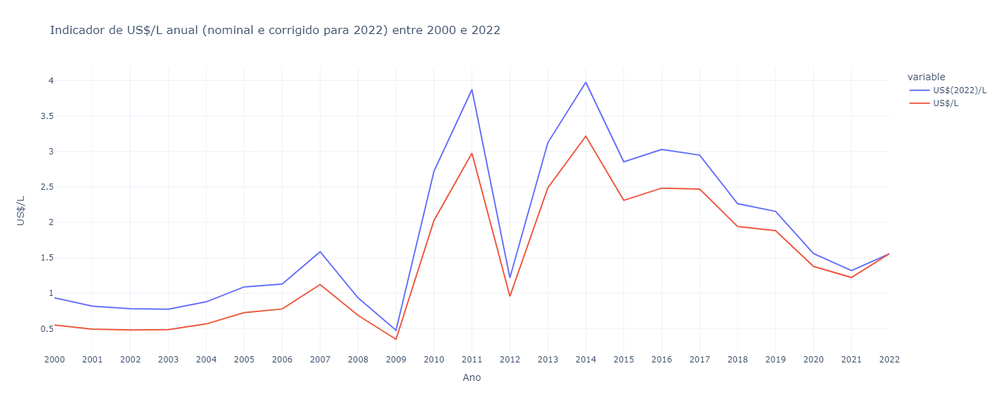

In [ ]:
px.line(
    expvinho_viti_sum_year[['US$(2022)/L','US$/L']],
    title="Indicador de US$/L anual (nominal e corrigido para 2022) entre 2000 e 2022",
    width=fig_w + 200,
    height=fig_h,
   labels={"value":"US$/L","index": "Ano"},
)

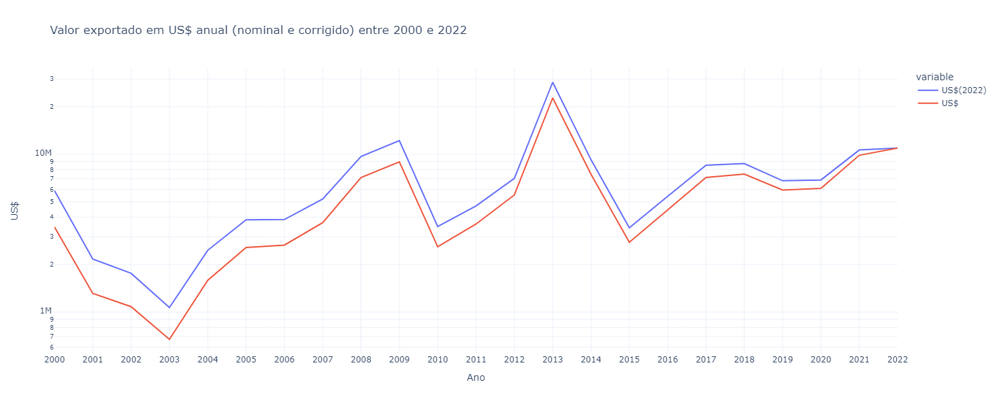

In [ ]:
px.line(
    expvinho_viti_sum_year[['US$(2022)','US$']],
    title="Valor exportado em US$ anual (nominal e corrigido) entre 2000 e 2022",
    width=fig_w + 200,
    height=fig_h,
    labels={"value":"US$","index": "Ano"},
    log_y=True,
)

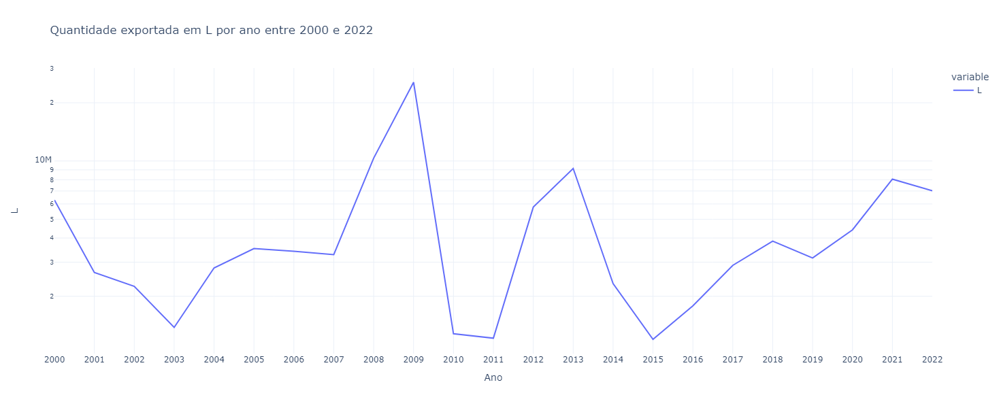

In [ ]:
px.line(
    expvinho_viti_sum_year['L'],
    title="Quantidade exportada em L por ano entre 2000 e 2022",
    width=fig_w + 200,
    height=fig_h,
    log_y=True,
    labels={"value":"L", "index":"Ano"},
)

In [ ]:
expvinho_viti_sum_country = pd.DataFrame({"US$":expvinho_viti_val.T.sum(),
                                          "US$(2022)":expvinho_viti_val_corrected.T.sum(),
                                          "L":expvinho_viti_qt.T.sum(),
                                          "US$/L":expvinho_viti_val.T.sum()/expvinho_viti_qt.T.sum(),
                                           "US$(2022)/L":expvinho_viti_val_corrected.T.sum()/expvinho_viti_qt.T.sum()}).dropna()
print_markdown(r"## " + "Valor e Quantidade" + " total por país")
show(expvinho_viti_sum_country, caption="Valor e Quantidade - Total por país", order=[[1, "dsc"]])


## Valor e Quantidade total por país

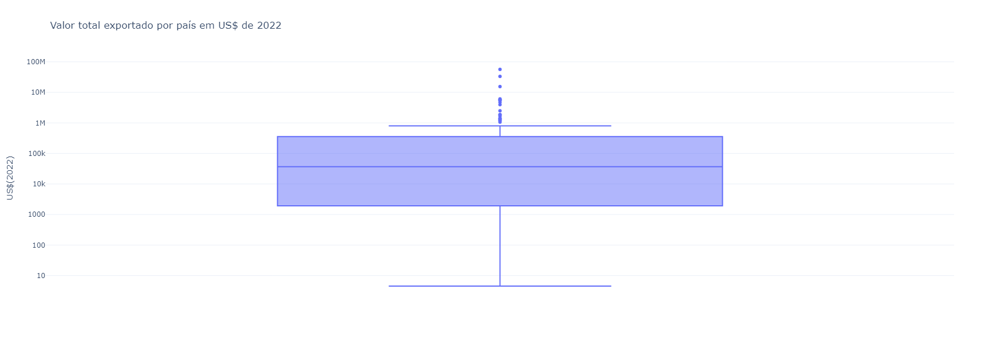

In [ ]:
px.box(expvinho_viti_sum_country,y="US$(2022)",
      title="Valor total exportado por país em US$ de 2022",
       height=fig_h,
       width=fig_w,
       log_y=True,

      )

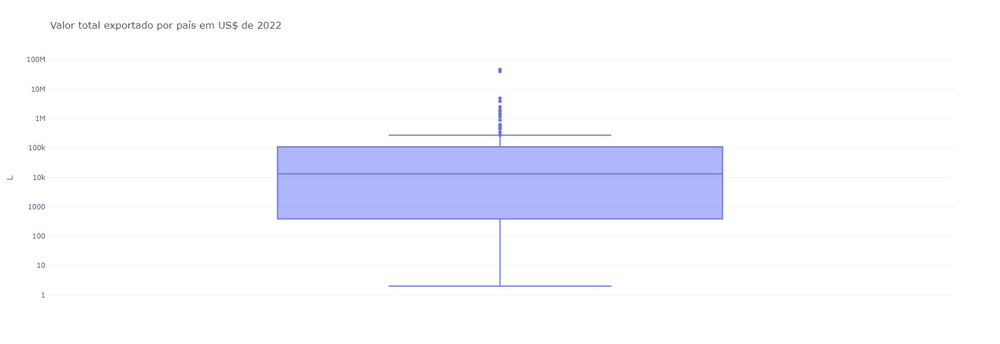

In [ ]:
px.box(expvinho_viti_sum_country,y="L",
      title="Valor total exportado por país em US$ de 2022",
       height=fig_h,
       width=fig_w,
       log_y=True,

      )

Primeiramente analisaremos a série dos dados de quantidade e valor exportado a partir dos dados  extraídos diretamente do Comexstat. Tal escolha decorreu do fato de que, havendo a fonte primária, é preferível utilizar os dados dela provenientes com vistas a garantir a fidedignidade dos dados.
Outro ponto que nos fez optar pelo uso dos dados do Comexstat é que assim pudemos ter acesso aos dados também em base mensal, os quais são úteis para análises mais completas.

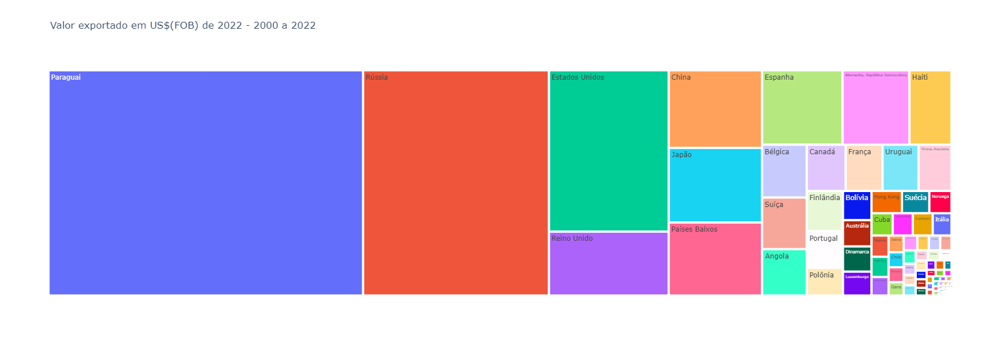

In [ ]:
df = expvinho_viti_sum_country.reset_index()
df.sort_values('US$(2022)',inplace=True, ascending=False)
px.treemap(
    df,
    path=["País"],
    values='US$(2022)',
    color_continuous_scale="RdBu",
    width=fig_w,
    height=fig_h,
    title="Valor exportado em US$(FOB) de 2022 - 2000 a 2022",
)

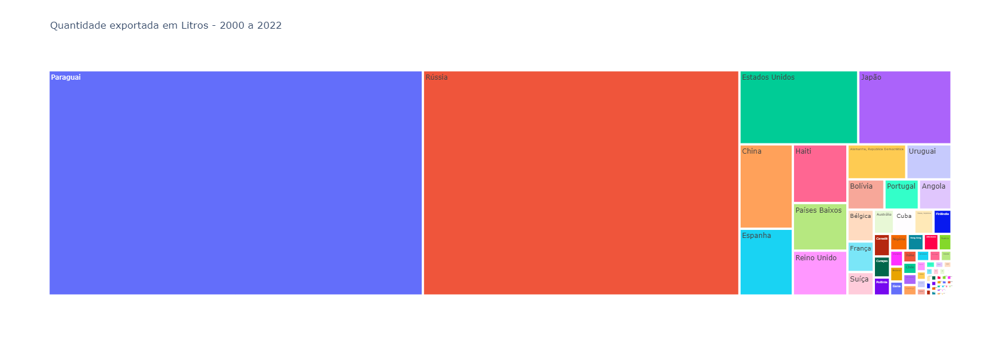

In [ ]:
px.treemap(
    df,
    path=["País"],
    values='L',
    color_continuous_scale="RdBu",
    width=fig_w,
    height=fig_h,
    title="Quantidade exportada em Litros - 2000 a 2022",
)

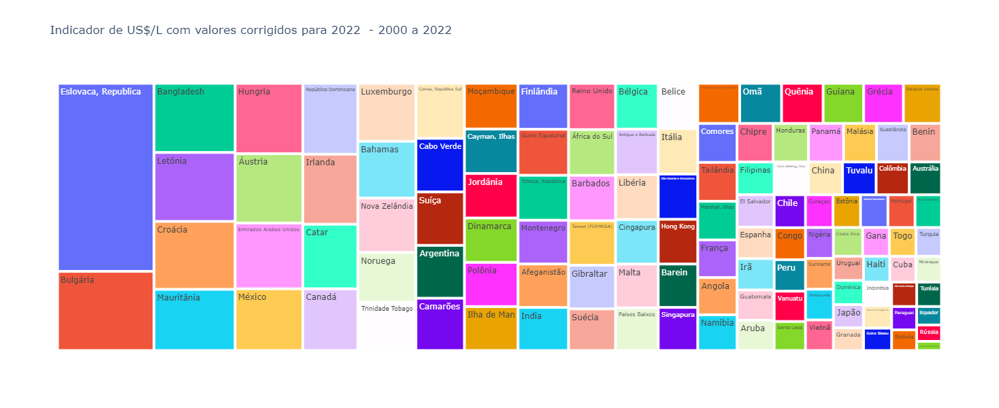

In [ ]:
px.treemap(
    df,
    path=["País"],
    values='US$(2022)/L',
    color_continuous_scale="RdBu",
    width=fig_w,
    height=fig_h,
    title="Indicador de US$/L com valores corrigidos para 2022  - 2000 a 2022",
)

## Análise de relação com outras variáveis

### Câmbio

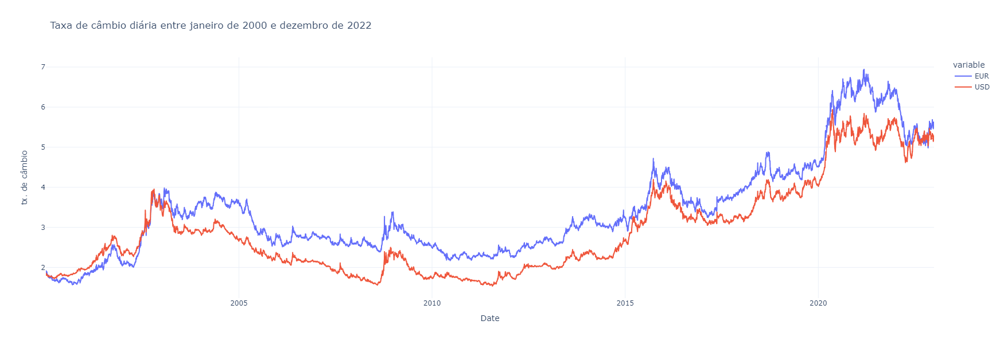

In [ ]:
from bcb import currency

cy = currency.get(['USD', 'EUR'], start = '2000-01-01', end='2022-12-31')

px.line(
    cy,
    height=fig_h,
    width=fig_w,
    title="Taxa de câmbio diária entre janeiro de 2000 e dezembro de 2022",
    labels={'value':'tx. de câmbio'},
)

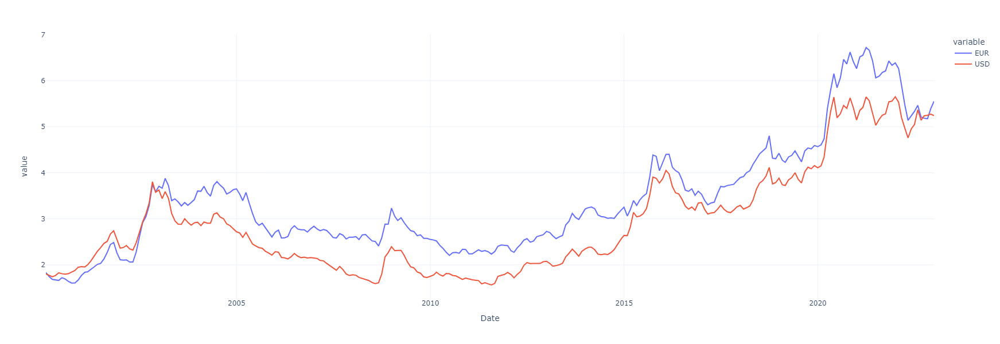

In [ ]:
cambio_mensal = cy.resample('M').mean()
px.line(cambio_mensal, width=fig_w, height=fig_h)

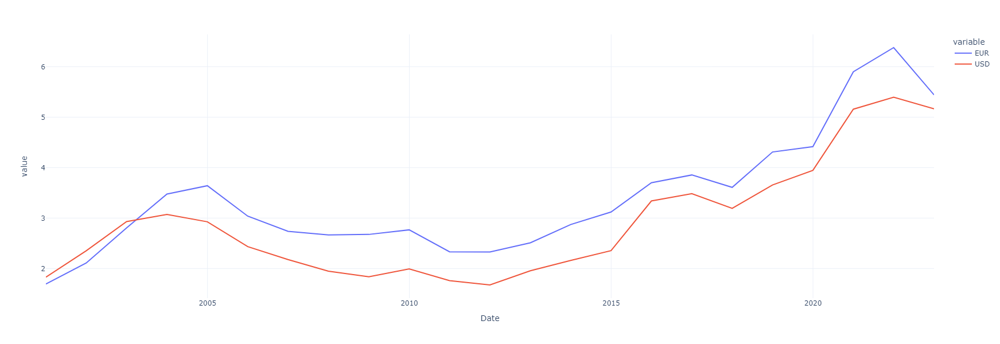

In [ ]:
cambio_anual = cy.resample('Y').mean()
px.line(cambio_anual, height=fig_h, width=fig_w)

#### Câmbio - média anual

In [ ]:
# prepara o dataframe de média anual de câmbio para o join com as medidas de interesse em base anual
df1 = media_anual.reset_index()
df1['Ano'] = [int(str(x).split('-')[0]) for x in df1['Date']]
df1.drop('Date', inplace=True, axis=1)

# dataframe com as medidas de   interesse em base anual
values_by_year = expvinho_viti_sum_year.reset_index()
values_by_year.rename(columns={"index":"Ano"}, inplace=True)
values_by_year["Ano"] = values_by_year["Ano"].astype("int64")
#df2 = df2.join(df1, on = "Ano")
values_by_year = pd.concat([values_by_year,df1], axis=1, join="inner")
values_by_year = values_by_year.loc[:,~values_by_year.T.duplicated(keep='first')]
show(values_by_year, caption="Valor, Quantidade, Valor/Quantidade, Câmbio EUR/R\$ e Câmbio USD/R\$ - Total por ano")



In [ ]:
profile = ProfileReport(values_by_year)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

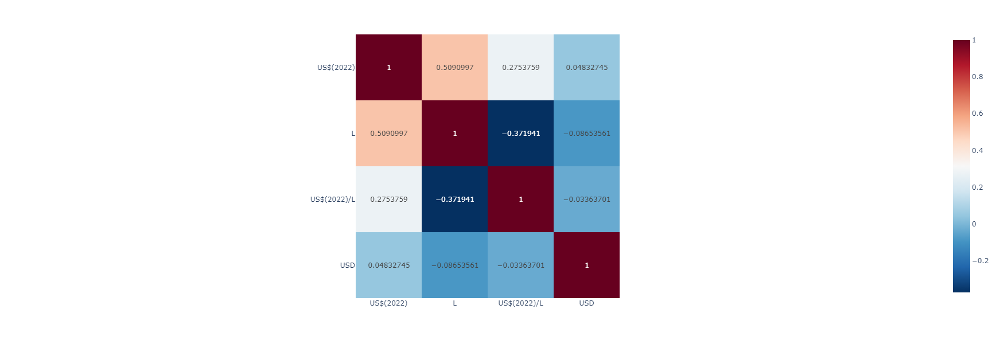

In [ ]:
px.imshow(values_by_year[["US$(2022)","L","US$(2022)/L","USD"]].corr(), text_auto=True,  color_continuous_scale='RdBu_r', width=fig_w, height=fig_h)

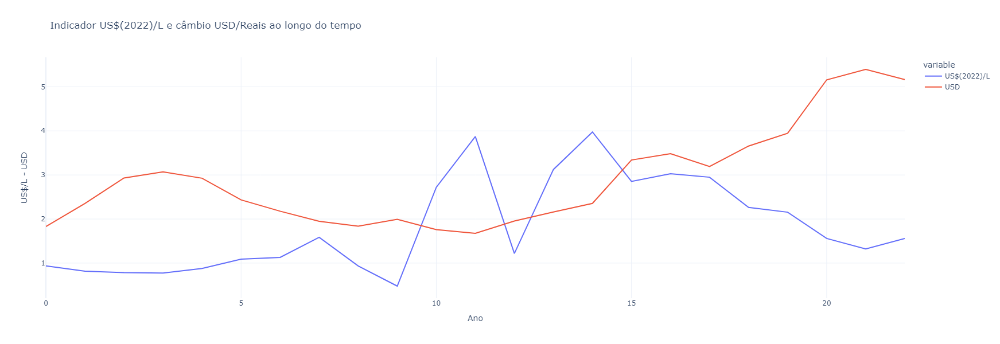

In [ ]:
px.line(values_by_year[["US$(2022)/L","USD"]],
        height=fig_h,
        width= fig_w,
        title="Indicador US$(2022)/L e câmbio USD/Reais no período analisado",
        labels={"index":"Ano","value":"US$/L - USD"},
)

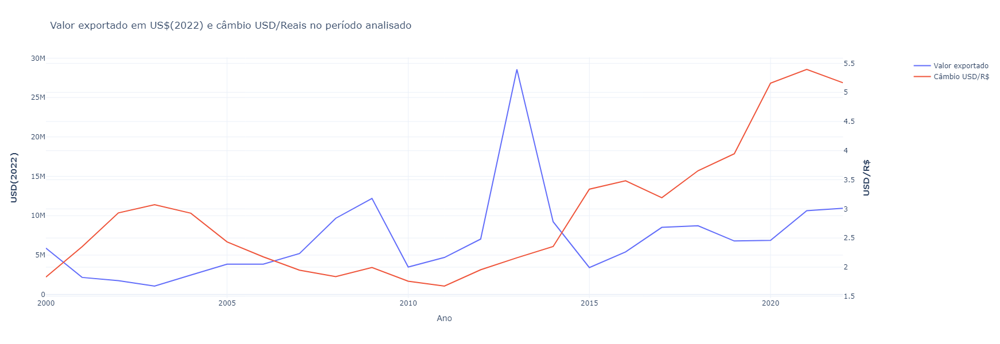

In [ ]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=values_by_year["Ano"], y=values_by_year["US$(2022)"], name="Valor exportado"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=values_by_year["Ano"], y=values_by_year["USD"], name="Câmbio USD/R$"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Valor exportado em US$(2022) e câmbio USD/Reais no período analisado",
    width=fig_w,
    height=fig_h,
)

# Set x-axis title
fig.update_xaxes(title_text="Ano")

# Set y-axes titles
fig.update_yaxes(title_text="<b>USD(2022)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>USD/R$</b>", secondary_y=True)


fig.show()

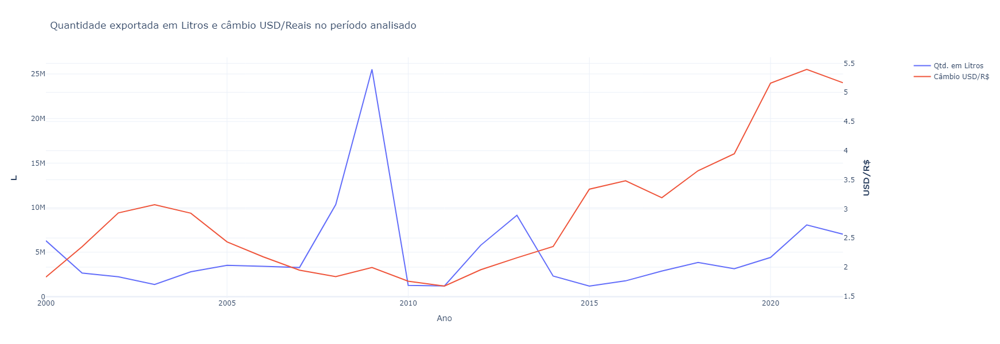

In [ ]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=values_by_year["Ano"], y=values_by_year["L"], name="Qtd. em Litros"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=values_by_year["Ano"], y=values_by_year["USD"], name="Câmbio USD/R$"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Quantidade exportada em Litros e câmbio USD/Reais no período analisado",
    width=fig_w,
    height=fig_h,
)

# Set x-axis title
fig.update_xaxes(title_text="Ano")

# Set y-axes titles
fig.update_yaxes(title_text="<b>L</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>USD/R$</b>", secondary_y=True)


fig.show()

#####  Conclusão parcial

**Considerando as séries anuais, não existe correlação relevante entre taxa de câmbio, valor exportado e quantidade exportada**

#### Teste de causalidade granger

In [ ]:
from statsmodels.tsa.stattools import adfuller


def adf_test(series:pd.Series):
    """
    Teste de estacionariedade ADF

    """
    print(f'Name: {series.name}')
    result = adfuller(series)
    print(f'Test Statistics: {result[0]}')
    print(f'p-value: {result[1]}')
    print(f'critical_values: {result[4]}')
    if result[1] > 0.05:
        print("Series is not stationary")
    else:
        print("Series is stationary")
    print("\n")
    return


values_by_year_select = values_by_year[['Ano','US$(2022)', 'L', 'USD', 'US$(2022)/L']]
values_by_year_select.set_index("Ano", inplace=True)
# aplica os testes de estacionariedade às séries de interesse

values_by_year_select.apply(adf_test);

# for col in values_by_year_select.columns:
#     print(f'Série: {col}')
#     adf_test(values_by_year_select[col])
#     print('\n')


Name: US$(2022)
Test Statistics: -3.1552828201419625
p-value: 0.02272343475175413
critical_values: {'1%': -3.7883858816542486, '5%': -3.013097747543462, '10%': -2.6463967573696143}
Series is stationary


Name: L
Test Statistics: -4.596520103013327
p-value: 0.00013109082971394818
critical_values: {'1%': -4.068853732362312, '5%': -3.1271488757396453, '10%': -2.7017297633136095}
Series is stationary


Name: USD
Test Statistics: 0.10768178623826959
p-value: 0.9665816685923044
critical_values: {'1%': -3.769732625845229, '5%': -3.005425537190083, '10%': -2.6425009917355373}
Series is not stationary


Name: US$(2022)/L
Test Statistics: -1.9410870741380661
p-value: 0.31298602093873573
critical_values: {'1%': -3.9240193847656246, '5%': -3.0684982031250003, '10%': -2.67389265625}
Series is not stationary




In [ ]:
#  como a série de câmbio é não-estacionária (conforme esperado), calcula-se a primeira diferença
diff1_cambio = values_by_year['USD'].diff().dropna()
diff1_USD_L = values_by_year['US$(2022)/L'].diff().dropna()
values_by_year_select = values_by_year[['US$(2022)']].iloc[1:]

print(diff1_cambio.shape)
print(diff1_USD_L.shape)
print(values_by_year_select.shape)

(22,)
(22,)
(23, 4)


## Outros dados

In [ ]:
# carrega os dados de exportação dos dados extraídos do Comexstat com frequência mensal
expvinho_mensal = (pd.read_csv("../data/EXP_VINHO_2000_2022_20231118_mensal.csv", sep=";")
    .drop(['Código CUCI Item', 'Descrição CUCI Item'], axis=1)
)
expvinho_mensal.rename({'Valor FOB (US$)':'US$','Quilograma Líquido':'L'}, inplace=True, axis=1)
show(expvinho_mensal)

In [ ]:
cpi_us_monthly = pl.read_csv(
    "../data/cpi_brazil_us/CPIAUCSL_monthly.csv",
    separator=",",
    dtypes={"DATE": pl.Date, "CPIAUCSL": pl.Float64},
).rename({"DATE": "date", "CPIAUCSL": "cpi"})

infl_month = pl.Series(
    "infl_month",
    1.0
    / (
        cpi_us_monthly["cpi"]
        / cpi_us_monthly.filter(pl.col("date") == date(2022, 12, 1))["cpi"]
    ),
)

cpi_us_monthly.insert_at_idx(2, infl_month)

exp_vinho_monthly_corrected = exp_vinho_monthly.join(cpi_us_monthly, on="date").sort(
    "date"
)

(
    exp_vinho_monthly_corrected.insert_at_idx(
        4,
        pl.Series(
            "value_corrected",
            exp_vinho_monthly_corrected["value"]
            * exp_vinho_monthly_corrected["infl_month"],
        ),
    )
)

exp_vinho_monthly_corrected = exp_vinho_monthly_corrected.drop(["cpi", "infl_month"])
show(exp_vinho_monthly_corrected)

#### Câmbio - média mensal

In [ ]:
# carrega dados extraídos do sistema do MDIC na forma de
exp_vinho = (
    pl.read_csv("../data/EXP_VINHO_2000_2022_20231118_anual.csv", separator=";").rename(
        {
            "Ano": "year",
            "Países": "country",
            "Valor FOB (US$)": "value",
            "Quilograma Líquido": "quantity",
        }
    )
).drop(["Código CUCI Item", "Descrição CUCI Item"])


# carrega os dados com as colunas necessárias para posterior plotagem dos dados em mapa
df = px.data.gapminder()

geo_info = (
    df.groupby(["country", "iso_alpha"])
    .first()
    .reset_index()[["country", "iso_alpha", "continent"]]
)

# carrega os nomes dos países em inglês e em português para os países
countries_names = pl.read_csv("../data/countries_names.csv", truncate_ragged_lines=True)

# exp_vinho = pl.DataFrame.join(pl.from_dataframe(geo_info), exp_vinho, on="country")

NameError: name 'pl' is not defined

In [ ]:
(exp_vinho
    .filter(pl.col('country') == 'Rússia')
    .select(pl.col(['year', 'value']))
).head()

In [ ]:
import pandas as pd

exp_vinho_viti = pd.read_csv('../data/ExpVinho.csv', sep=';')
display(exp_vinho_viti.head())
filtered_cols = exp_vinho_viti.filter(like='.1', axis=1)
display(exp_vinho_viti[exp_vinho_viti['País'] == 'Rússia'].filter(like='.1', axis=1))




In [ ]:
show(exp_vinho)

## Total acumulado entre 2000 e 2022 (valor em US$ de 2022 e quantidade em 1KG=1L)

In [ ]:
exp_vinho_top20 = (
    exp_vinho_corrected.group_by(by="country")
    .sum()
    .select(pl.col(["country", "value_corrected", "quantity"]))
    .sort("value_corrected", descending=True)
    .limit(20)
)
show(exp_vinho_top20)

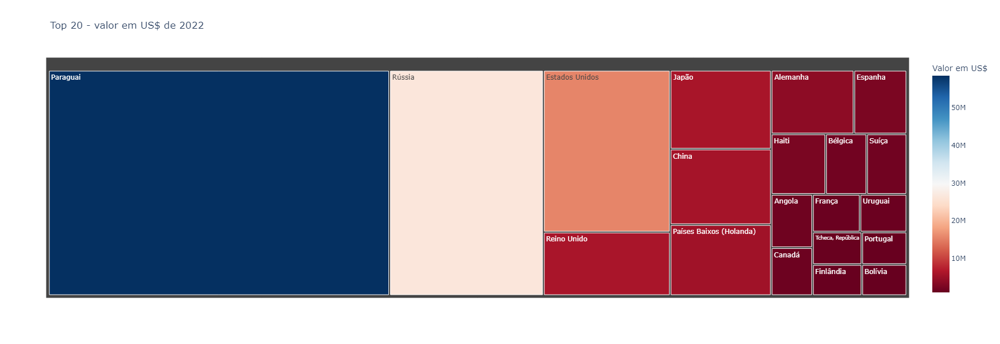

In [ ]:
px.treemap(
    exp_vinho_top20,
    path=["country"],
    values="value_corrected",
    color="value_corrected",
    color_continuous_scale="RdBu",
    width=fig_w,
    height=fig_h,
    title="Top 20 - valor em US$ de 2022",
    labels={"value_corrected": "Valor em US$"},
)

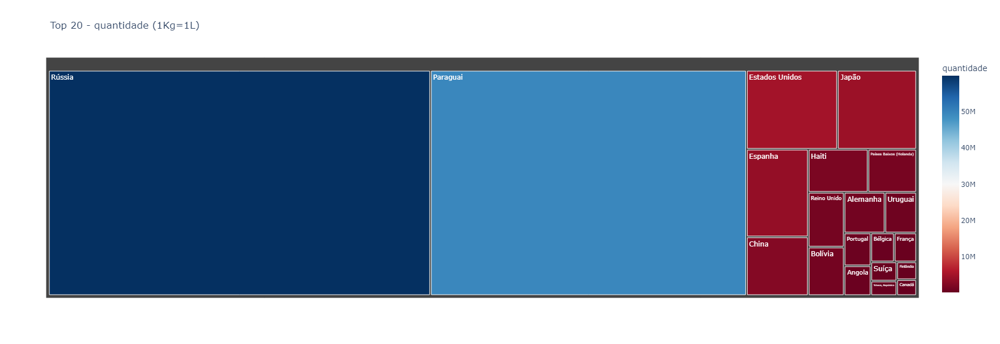

In [ ]:
px.treemap(
    exp_vinho_top20,
    path=["country"],
    values="quantity",
    color="quantity",
    color_continuous_scale="RdBu",
    width=fig_w,
    height=fig_h,
    title="Top 20 - quantidade (1Kg=1L)",
    labels={"quantity": "quantidade"},
)

## Evolução anual dos 5 maiores compradores

### Top 5 - valor em US$ de 2022

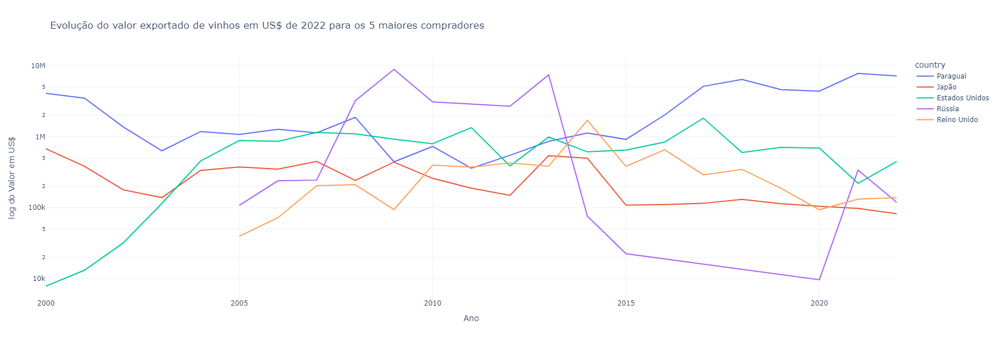

In [ ]:
px.line(
    exp_vinho_corrected.filter(
        pl.col("country").is_in(exp_vinho_top20["country"].limit(5))
    ),
    x="year",
    y="value_corrected",
    color="country",
    log_y=True,
    width=fig_w + 200,
    height=fig_h,
    title="Evolução do valor exportado de vinhos em US$ de 2022 para os 5 maiores compradores",
    labels={"value_corrected": "log do Valor em US$", "year": "Ano", "county": "país"},
)

### Top 5 - quantidade (1kg=1L)

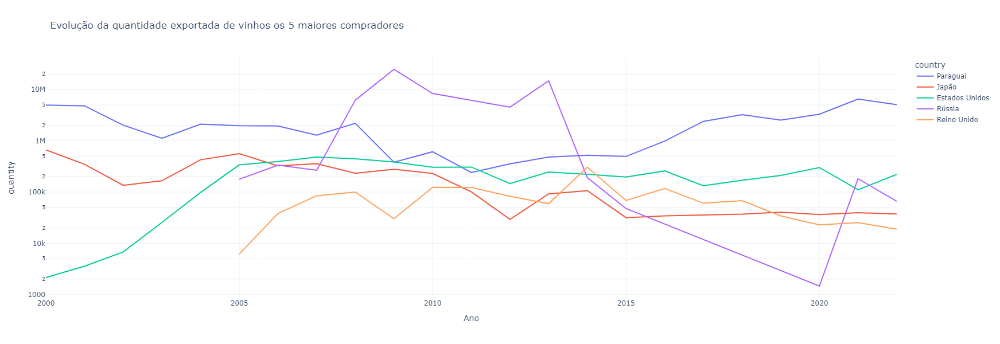

In [ ]:
px.line(
    exp_vinho_corrected.filter(
        pl.col("country").is_in(exp_vinho_top20["country"].limit(5))
    ),
    x="year",
    y="quantity",
    color="country",
    log_y=True,
    width=fig_w + 200,
    height=fig_h,
    title="Evolução da quantidade exportada de vinhos os 5 maiores compradores",
    labels={"value_corrected": "log da quantidade", "year": "Ano", "county": "país"},
)

# Série Mensal - Extraída do Comexstat

In [ ]:
from datetime import date

exp_vinho_monthly = (
    (
        pl.read_csv(
            "../data/EXP_VINHO_2000_2022_20231118_mensal.csv", separator=";"
        ).rename(
            {
                "Ano": "year",
                "Mês": "month",
                "Países": "country",
                "Valor FOB (US$)": "value",
                "Quilograma Líquido": "quantity",
            }
        )
    )
    .drop(["Código CUCI Item", "Descrição CUCI Item"])
    .with_columns(pl.date(pl.col("year"), pl.col("month"), 1).alias("date"))
)


show(exp_vinho_monthly)

Ajuste pelo CPI mensal:

In [ ]:
cpi_us_monthly = pl.read_csv(
    "../data/cpi_brazil_us/CPIAUCSL_monthly.csv",
    separator=",",
    dtypes={"DATE": pl.Date, "CPIAUCSL": pl.Float64},
).rename({"DATE": "date", "CPIAUCSL": "cpi"})

infl_month = pl.Series(
    "infl_month",
    1.0
    / (
        cpi_us_monthly["cpi"]
        / cpi_us_monthly.filter(pl.col("date") == date(2022, 12, 1))["cpi"]
    ),
)

cpi_us_monthly.insert_at_idx(2, infl_month)

exp_vinho_monthly_corrected = exp_vinho_monthly.join(cpi_us_monthly, on="date").sort(
    "date"
)

(
    exp_vinho_monthly_corrected.insert_at_idx(
        4,
        pl.Series(
            "value_corrected",
            exp_vinho_monthly_corrected["value"]
            * exp_vinho_monthly_corrected["infl_month"],
        ),
    )
)

exp_vinho_monthly_corrected = exp_vinho_monthly_corrected.drop(["cpi", "infl_month"])
show(exp_vinho_monthly_corrected)

## Evolução mensal dos 5 maiores compradores

### Top 5 - valor em US$ de 2022

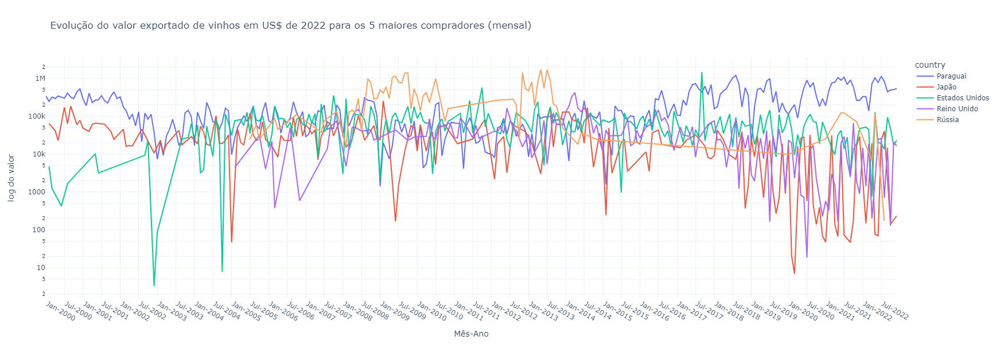

In [ ]:
px.line(
    exp_vinho_monthly_corrected.filter(
        pl.col("country").is_in(exp_vinho_top20["country"].limit(5))
    )
    .sort("date")
    .to_pandas(),
    x="date",
    y="value_corrected",
    color="country",
    log_y=True,
    width=fig_w + 200,
    height=fig_h,
    title="Evolução do valor exportado de vinhos em US$ de 2022 para os 5 maiores compradores (mensal)",
    labels={"value_corrected": "log do valor", "date": "Mês-Ano", "county": "país"},
    template="plotly_white",
).update_xaxes(dtick="M6", tickformat="%b-%Y", ticklabelmode="period")

### Top 5 - quantidade (1kg=1L)

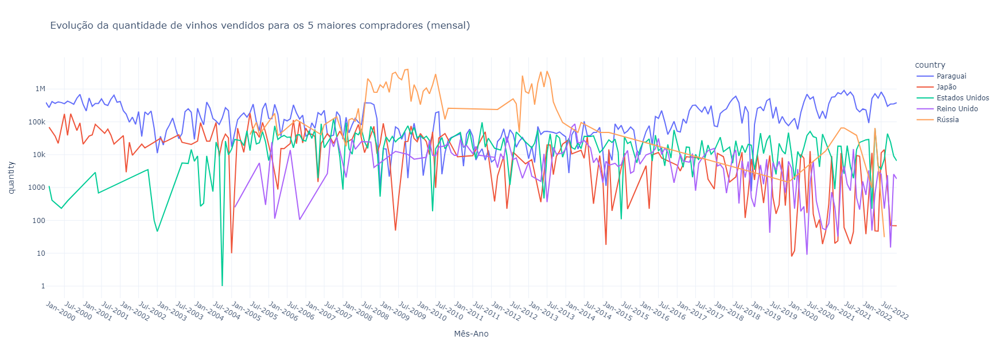

In [ ]:
px.line(
    exp_vinho_monthly_corrected.filter(
        pl.col("country").is_in(exp_vinho_top20["country"].limit(5))
    )
    .sort("date")
    .to_pandas(),
    x="date",
    y="quantity",
    color="country",
    log_y=True,
    width=fig_w + 200,
    height=fig_h,
    title="Evolução da quantidade de vinhos vendidos para os 5 maiores compradores (mensal)",
    labels={"value_corrected": "log do valor", "date": "Mês-Ano", "county": "país"},
    template="plotly_white",
).update_xaxes(dtick="M6", tickformat="%b-%Y", ticklabelmode="period")

## Análise de séries temporais e previsões

In [ ]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

In [ ]:
exp_vinho_monthly_top5 = exp_vinho_monthly_corrected.filter(
    pl.col("country").is_in(exp_vinho_top20["country"].limit(5))
)
exp_vinho_monthly_top5.head()

year,month,country,value,value_corrected,quantity,date
i64,i64,str,i64,f64,i64,date
2000,1,"""Paraguai""",193841,342330.304725,390179,2000-01-01
2000,2,"""Paraguai""",140681,247424.777588,273502,2000-02-01
2000,2,"""Japão""",36759,64650.431824,68572,2000-02-01
2000,2,"""Estados Unidos…",2700,4748.664706,1118,2000-02-01
2000,3,"""Paraguai""",183621,321057.560175,415646,2000-03-01


In [ ]:
qty_series = (
    exp_vinho_monthly_top5.filter(pl.col("country") == "Paraguai")
    .select(pl.col("date"), pl.col("quantity"))
    .to_pandas()
)
qty_series.columns = ["ds", "y"]
qty_series.head()

,ds,y
0,2000-01-01,390179
1,2000-02-01,273502
2,2000-03-01,415646
3,2000-04-01,365776
4,2000-05-01,405252


In [ ]:
m = Prophet(interval_width=0.95)
m.fit(qty_series)

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: C:\Users\carlo\AppData\Local\Temp\tmp0vkq6gdn\nxb0ss7b.json
DEBUG:cmdstanpy:input tempfile: C:\Users\carlo\AppData\Local\Temp\tmp0vkq6gdn\uv1_8k62.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\projects\\alura_postech\\tech_challenge_fase01\\wineData\\.venv\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=17727', 'data', 'file=C:\\Users\\carlo\\AppData\\Local\\Temp\\tmp0vkq6gdn\\nxb0ss7b.json', 'init=C:\\Users\\carlo\\AppData\\Local\\Temp\\tmp0vkq6gdn\\uv1_8k62.json', 'output', 'file=C:\\Users\\carlo\\AppData\\Local\\Temp\\tmp0vkq6gdn\\prophet_modelotl2w5of\\prophet_m

In [ ]:
future = m.make_future_dataframe(periods=36, freq="M")
future.tail()

,ds
305,2025-07-31
306,2025-08-31
307,2025-09-30
308,2025-10-31
309,2025-11-30


In [ ]:
forecast = m.predict(future)
forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail()

,ds,yhat,yhat_lower,yhat_upper
305,2025-07-31,654393.346353,417010.750975,913574.278439
306,2025-08-31,661603.479453,389204.328500,936470.862766
307,2025-09-30,669584.853874,415899.653391,956335.223222
308,2025-10-31,676190.898402,388334.909723,925292.207978
309,2025-11-30,678264.041020,412736.845228,949196.504852


In [ ]:
# fig1 = m.plot(forecast)
plot_plotly(m, forecast)

In [ ]:
plot_components_plotly(m, forecast)

In [ ]:
qty_series = qty_series.set_index("ds")

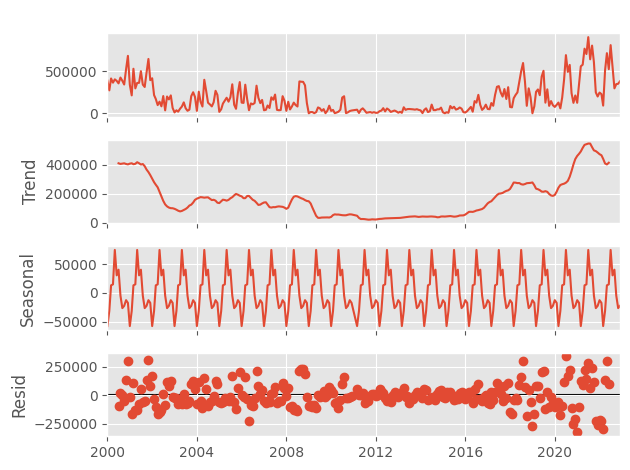

In [ ]:
seasonal_decompose(qty_series["y"], model="additive", period=12).plot()